## Global signal simulation
_Phil Bull, 2023-01-09_

This notebook uses hera_sim to generate a simple global signal simulation.

In [1]:
import numpy as np
import pylab as plt

import pyuvdata
from pyuvdata import UVData, UVCal
import hera_sim, vis_cpu, pyuvsim
from hera_sim.visibilities import VisibilitySimulation, ModelData, VisCPU

import astropy
from astropy import units as u
from astropy.coordinates import EarthLocation, SkyCoord, AltAz
from astropy.time import Time

import time, json, h5py

import pygdsm
import pyradiosky
import healpy as hp
import astropy_healpix

import matplotlib.patches as patches

from beam_show_ops import load_beam

plt.rcParams["figure.figsize"] = (10, 5)

np.seterr(all="warn")

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

## Table of Contents

* [Simulation parameters](#params)
* [Utility functions](#utils)
* [Simple antenna gain model](#gains)
* [Primary beams](#beams)
* [Diffuse emission](#diffuse)
* [Point sources from catalogue](#ptsrc-cat)
* [Synthetic point source catalogue](#ptsrc-synthetic)
* [Simulate point source visibilities](#ptsrc-sim)
* [21cm signal](#21cm)
* [Noise diode](#ndiode)
* [Combined sky and calibrator signals](#skycal)
* [Calibration loads](#loads)
* [Reflections](#reflections)
* [Applying gains](#apply-gains)
* [Save data](#save-data)

<a id='params'></a>
## Simulation parameters

In [2]:
# Frequencies and times
Nfreqs = 280
Ntimes = 3600
dt = 2. # 2 sec
jd = 2459873.83333 # 2022-10-21, 8pm UTC

# Site location
site_lat = 53.235002 # deg
site_lon = -2.3044349 # deg
site_height = 77. # m

# Random seed
random_seed = 4

# Frequency array
freqs = np.linspace(60., 88., Nfreqs) # MHz

# Diffuse model properties
diffuse_sim_nblocks = 5 # chunk in frequency to reduce memory reqs
diffuse_nside = 16 # Diffuse map nside

# Bandpass parameters (Chebyshev)
bandpass_ncoeffs = 50 #12
bandpass_ripple_factor = 0.01
bandpass_rolloff_scale_low = 1.
bandpass_rolloff_scale_high = 1.

# Correlated gain parameters
gain_corr_beta = -1.1
gain_corr_scale = 5.
fknee = 1. / (200.) # 200 sec

# Instrumental noise
Tinstrument = 300. # K

# Noise diode parameters
Tdiode = 60. # K
ndiode_ncoeffs = 20
ndiode_ripple_factor = 0.0005
ndiode_cadence = 10
ndiode_duration = 2
ndiode_gain = 10.
ndiode_bandpass_ncoeffs = 6
ndiode_bandpass_ripple_factor = 0.0005

# Calibration loads
Tload1 = 293. # K
load1_time_ncoeffs = 6
load1_time_amp = 3e-4
load1_freq_ncoeffs = 6
load1_freq_amp = 3e-4

Tload2 = 393. # K
load2_time_ncoeffs = 6
load2_time_amp = 3e-4
load2_freq_ncoeffs = 6
load2_freq_amp = 3e-4

# Noise-wave reflection parameters
Gamma_src_re0 = 0.01
Gamma_src_im0 = 0.01
Gamma_src_time_ncoeffs = 4
Gamma_src_time_amp = 0.5
Gamma_src_freq_ncoeffs = 8
Gamma_src_freq_amp = 0.5

Gamma_rec_re0 = 0.02
Gamma_rec_im0 = 0.02
Gamma_rec_time_ncoeffs = 4
Gamma_rec_time_amp = 0.5
Gamma_rec_freq_ncoeffs = 8
Gamma_rec_freq_amp = 0.5

# Noise-wave temperature parameters
Tunc0 = 250. # K
Tcos0 = 190. # K
Tsin0 = 90. # K
Toffset0 = 0. # K

Tunc_time_ncoeffs = 6
Tunc_time_amp = 1e-2
Tunc_freq_ncoeffs = 6
Tunc_freq_amp = 1e-2

Tcos_time_ncoeffs = 6
Tcos_time_amp = 1e-2
Tcos_freq_ncoeffs = 6
Tcos_freq_amp = 1e-2

Tsin_time_ncoeffs = 6
Tsin_time_amp = 1e-2
Tsin_freq_ncoeffs = 6
Tsin_freq_amp = 1e-2

Toffset_time_ncoeffs = 6
Toffset_time_amp = 1e-2
Toffset_freq_ncoeffs = 6
Toffset_freq_amp = 1e-2

# Output prefix
prefix = "sim_global"

In [3]:
np.random.seed(random_seed)

In [4]:
# Jodrell Bank location
location = EarthLocation.from_geodetic(lat=site_lat,
                                       lon=site_lon,
                                       height=site_height)

# Observation time
obstime = Time(jd, format='jd')
print(obstime.iso)

# Time offsets from 'obstime'
times = np.linspace(0., Ntimes*dt, Ntimes) * u.second

2022-10-21 07:59:59.712


In [5]:
lsts = []
for tt in times:
    frame = AltAz(obstime=obstime + tt, location=location)
    lsts.append((obstime + tt).sidereal_time('apparent', longitude=location.lon).rad)
lsts = np.array(lsts)

In [6]:
# Construct array
ants = {0: [0., 0., 0.]}

<a id='utils'></a>
### Utility functions

In [7]:
def Jy_to_TRJ(flux, freqs, omega):
    """
    Convert data in Jy to units of T_RJ (Kelvin).
    
    Parameters:
        flux (array_like):
            Array of shape (Ntimes, Nfreqs) in Jy units.
        freqs (array_like):
            Frequencies, in MHz.
        omega (array_like):
            Beam solid angle (sterad.) as a function of frequency.
    
    Returns:
        Trj (array_like):
            Input flux array rescale to T_RJ units.
    """
    assert len(flux.shape) == 2, "`flux` must have shape (Ntimes, Nfreqs)"
    assert flux.shape[1] == freqs.size, "`flux` must have shape (Ntimes, Nfreqs)"
    assert omega.size == freqs.size, "`omega' must have shape (Nfreqs,)"
    
    # Define constants
    kB = 1.380649e-23 # m^2 kg s^-2 K^-1
    C = 299792458. # m/s
    
    # Perform conversion
    lam = C / (freqs * 1e6) # wavelength, in m
    fac = lam**2. / (2. * kB * omega) * 1e-26
    Trj = flux * fac[np.newaxis,:]
    return Trj

In [8]:
def chebyshev_model(x, ncoeffs, amp):
    """
    This convenience function produces a Chebyshev series model in 
    frequency/time/etc. to produce a model for various components 
    and systematic effects.
    
    Parameters:
        x (array_like):
            Time/freq. variable.
        ncoeffs (int):
            No. of Chebyshev coefficients to use.
        amp (float):
            Overall amplitude of the Chebyshev polynomial.
    
    Returns:
        fn (array_like):
            Chebyshev function. 
    """
    # Chebyshev parameters
    coeffs = amp * np.random.randn(ncoeffs)

    # Construct time- and frequency-dependent random Chebyshev functions
    xx = np.linspace(-1., 1., x.size)
    fn = np.polynomial.chebyshev.Chebyshev(coeffs)(xx)
    
    # Return values
    return fn

In [9]:
def get_beam_area(beam, freqs, naz=200, nza=300, beam_squared=False):
    
    # Regular grid in azimuth and zenith angle
    _az = np.linspace(0., 2.*np.pi, naz)
    _za = np.linspace(0., 0.5*np.pi, nza)
    az, za = np.meshgrid(_az, _za)
    
    # Get pixel sizes
    pix_az = _az[1] - _az[0]
    pix_za = _za[1] - _za[0]
    
    # Interpolate beam vs frequency
    beam.peak_normalize()
    b, _ = beam.interp(az_array=az.flatten(), za_array=za.flatten(), freq_array=freqs*1e6)
   
    # Reshape to (Nfreqs, Naz, Nza)
    b = b[0,0,1,:,:].copy()
    b = b.reshape((Nfreqs, az.shape[0], az.shape[1]))
    if beam_squared:
        b *= b
    
    # Multiply by sin(alt) and then sum to approximate integral
    b *= np.sin(0.5*np.pi - za)[np.newaxis,:,:]
    area = np.sum(b, axis=(1,2)) * (pix_az * pix_za)
    return area

<a id='gains'></a>
### Simple antenna gain model
The gains will be subject to bandpass effects, 1/f noise and so on.

fknee = 5.00 mHz


/tmp/ipykernel_3462593/4192935447.py:6: RuntimeWarning: divide by zero encountered in power
  corr_power = (np.abs(ff) / fknee)**gain_corr_beta
/tmp/ipykernel_3462593/4192935447.py:11: RuntimeWarning: underflow encountered in exp
  rolloff = np.exp(-0.5*(np.abs(ff))**2. / rolloff_scale**2.)
/tmp/ipykernel_3462593/4192935447.py:15: RuntimeWarning: underflow encountered in multiply
  gain_corr = 1. + gain_corr_scale * np.fft.ifft(np.sqrt(corr_power*rolloff) * nn).real


/tmp/ipykernel_3462593/4192935447.py:20: RuntimeWarning: underflow encountered in multiply
  plt.plot(ff, corr_power*rolloff, ls='dashed')


/users/hgarsden/miniconda3/envs/frf_paper/lib/python3.10/site-packages/matplotlib/scale.py:253: RuntimeWarning: underflow encountered in power
  return np.power(self.base, a)


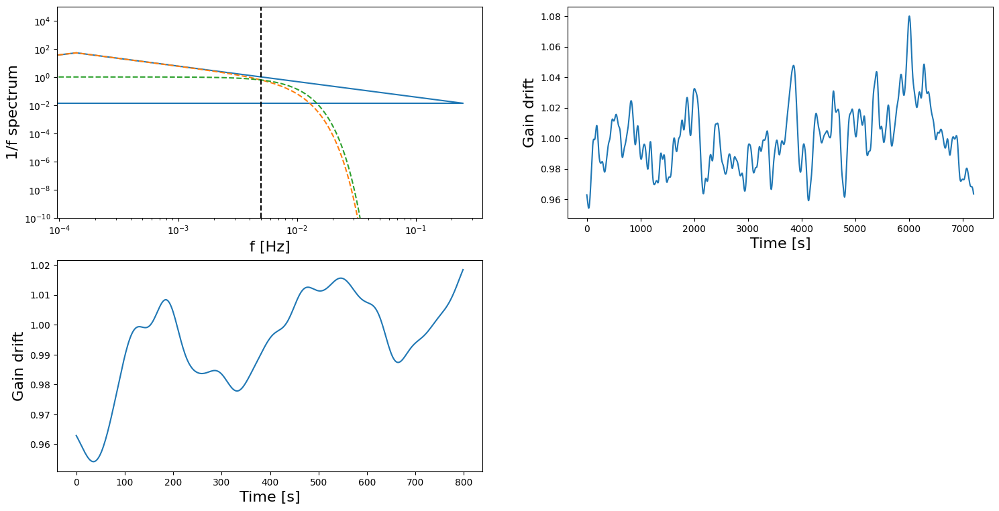

In [10]:
# 1/f noise as gain drifts
print("fknee = %3.2f mHz" % (fknee * 1e3))

# Do FFT on sqrt of power
ff = np.fft.fftfreq(Ntimes, d=dt)
corr_power = (np.abs(ff) / fknee)**gain_corr_beta
corr_power[ff == 0.] = 0.

# Add cutoff above knee frequency, for smoothing
rolloff_scale = fknee # Hz
rolloff = np.exp(-0.5*(np.abs(ff))**2. / rolloff_scale**2.)

# Do FFT of series of ones to get correlated gain rms
nn = np.random.randn(Ntimes) + 1.j*np.random.randn(Ntimes)
gain_corr = 1. + gain_corr_scale * np.fft.ifft(np.sqrt(corr_power*rolloff) * nn).real

# Plot 1/f spectrum
plt.subplot(221)
plt.plot(ff, corr_power)
plt.plot(ff, corr_power*rolloff, ls='dashed')
plt.plot(ff, rolloff, ls='dashed')
plt.axvline(fknee, color='k', ls='dashed')

plt.xscale('log')
plt.yscale('log')
plt.xlabel("f [Hz]", fontsize=16)
plt.ylabel("1/f spectrum", fontsize=16)

plt.ylim((1e-10, 1e5))

# Plot correlated gain drift
plt.subplot(222)
plt.plot(times, gain_corr)
plt.xlabel("Time [s]", fontsize=16)
plt.ylabel("Gain drift", fontsize=16)


# Zoom in on correlated gain drift
plt.subplot(223)
plt.plot(times[:400], gain_corr[:400])
plt.xlabel("Time [s]", fontsize=16)
plt.ylabel("Gain drift", fontsize=16)

plt.gcf().set_size_inches((18., 9.))

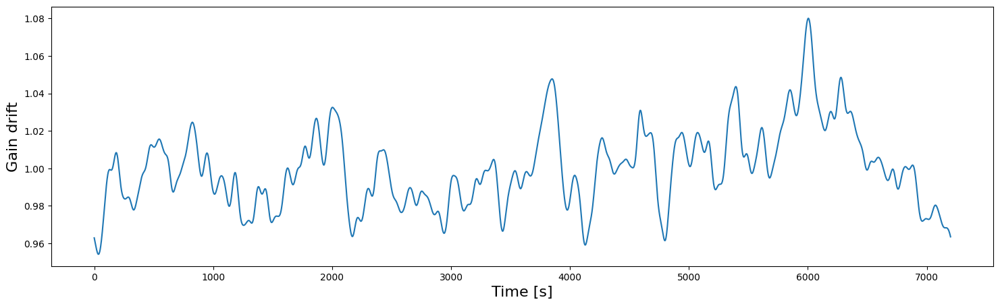

In [11]:
# Plot correlated gain drift in a bigger format
plt.subplot(111)
plt.plot(times, gain_corr)
plt.xlabel("Time [s]", fontsize=16)
plt.ylabel("Gain drift", fontsize=16)

plt.gcf().set_size_inches((18., 5.))

Text(0, 0.5, 'Bandpass')

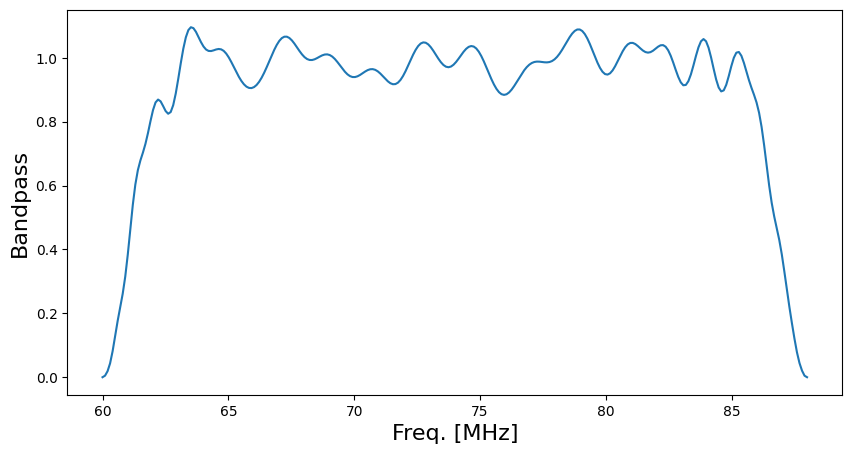

In [12]:
# Bandpass
# Use Chebyshev to simulate some ripples and add a steep roll-off
bandpass_shape = 1. + chebyshev_model(freqs, bandpass_ncoeffs, bandpass_ripple_factor)

# Make band-edge roll-offs
rolloff1 = 1. - np.exp(-0.5*((freqs - freqs[0]) / bandpass_rolloff_scale_low)**2.)
rolloff2 = 1. - np.exp(-0.5*((freqs - freqs[-1]) / bandpass_rolloff_scale_high)**2.)

# Construct bandpass with rolloffs
bandpass = bandpass_shape * rolloff1 * rolloff2

plt.subplot(111)
plt.plot(freqs, bandpass)

plt.xlabel("Freq. [MHz]", fontsize=16)
plt.ylabel("Bandpass", fontsize=16)

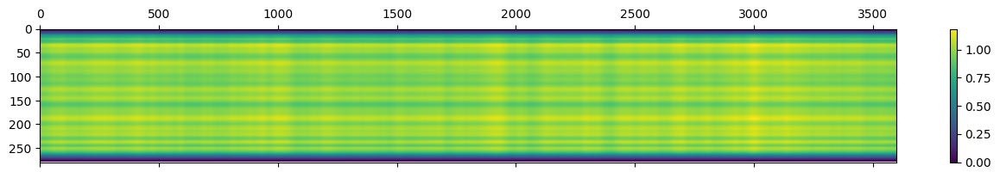

In [13]:
plt.matshow(bandpass[:,np.newaxis] * gain_corr[np.newaxis,:], aspect='auto')
plt.colorbar()

<a id='beams'></a>
## Primary beams
Beam is specified here. Must have an entry in beams.yaml.

In [14]:
import yaml

beam_spec = "BEAM_SPEC"                   # BEAM_SPEC will be set at pipeline execution time. It must be defined in beams.yaml.   
with open('beams.yaml', 'r') as file:
    beam_cfg = yaml.safe_load(file)[beam_spec]

beams = [ load_beam(beam_cfg, convert_sparse_to_sim_sparse=True, interp_freq_array=freqs*1e6, interp_freq_chunk=40) ]

prefix = prefix+"_"+beam_spec    
print(prefix)

sim_global_vivaldi_sparse


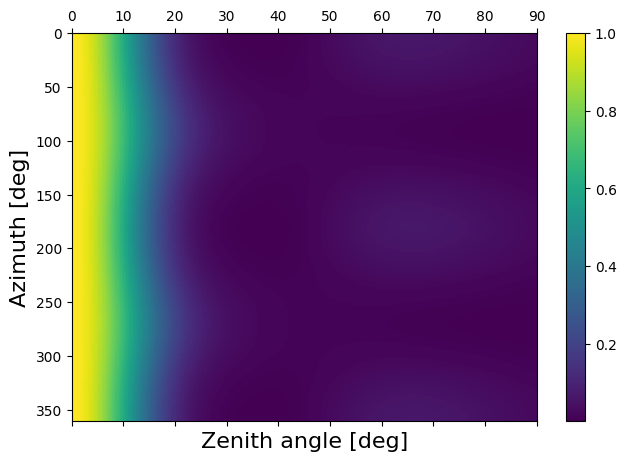

In [15]:
_az = np.linspace(0., 2.*np.pi, 200)
_za = np.linspace(0., 0.5*np.pi, 300)
az, za = np.meshgrid(_az, _za)

beams[0].peak_normalize()

b,_ = beams[0].interp(az_array=az.flatten(), za_array=za.flatten(), freq_array=np.array([freqs[0]*1e6,]))
beam = b[0,0,1,0,:].reshape(az.shape)

plt.matshow(beam.T, aspect='auto', extent=[np.rad2deg(_za.min()), np.rad2deg(_za.max()), 
                                           np.rad2deg(_az.max()), np.rad2deg(_az.min())])

plt.xlabel("Zenith angle [deg]", fontsize=16.)
plt.ylabel("Azimuth [deg]", fontsize=16.)
plt.colorbar()

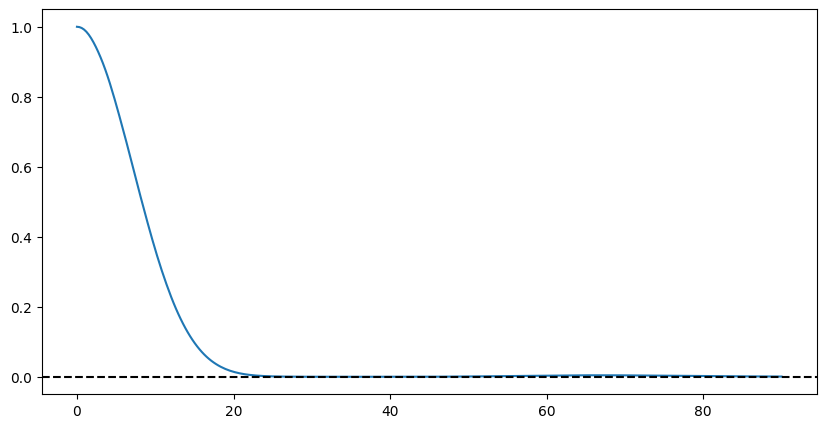

In [16]:
plt.plot(np.rad2deg(_za), beam[:,0]**2.)
plt.axhline(0., ls='dashed', color='k')

<a id='diffuse'></a>
## Diffuse emission

In [17]:
def gsm_sky_model(freqs, resolution="hi", nside=None):
    """
    Return a pyradiosky SkyModel object populated with a Global Sky Model datacube in 
    healpix format.
    Parameters
    ----------
    freqs : array_like
        Frequency array, in Hz.
    resolution : str, optional
        Whether to use the high or low resolution pygdsm maps. Options are 'hi' or 'low'.
    nside : int, optional
        Healpix nside to up- or down-sample the GSM sky model to. Default: `None` (use the 
        default from `pygdsm`, which is 1024).
    Returns
    -------
    sky_model : pyradiosky.SkyModel
        SkyModel object.
    """
    # Initialise GSM object
    gsm = pygdsm.GlobalSkyModel2016(data_unit="TRJ", resolution=resolution, freq_unit="Hz")

    # Construct GSM datacube
    hpmap = gsm.generate(freqs=freqs) # FIXME: nside=1024, ring ordering, galactic coords
    hpmap_units = "K"

    # Set nside or resample
    nside_gsm = int(astropy_healpix.npix_to_nside(hpmap.shape[-1]))
    if nside is None:
        # Use default nside from pygdsm map
        nside = nside_gsm
    else:
        # Transform to a user-selected nside
        hpmap_new = np.zeros((hpmap.shape[0], astropy_healpix.nside_to_npix(nside)), 
                             dtype=hpmap.dtype)
        for i in range(hpmap.shape[0]):
            hpmap_new[i,:] = hp.ud_grade(hpmap[i,:], 
                                         nside_out=nside, 
                                         order_in="RING", 
                                         order_out="RING")
        hpmap = hpmap_new

    # Get datacube properties
    npix = astropy_healpix.nside_to_npix(nside)
    indices = np.arange(npix)
    history = "pygdsm.GlobalSkyModel2016, data_unit=TRJ, resolution=low, freq_unit=MHz"
    freq = u.Quantity(freqs, "hertz")

    # hmap is in K
    stokes = u.Quantity(np.zeros((4, len(freq), len(indices))), hpmap_units)
    stokes[0] = hpmap * u.Unit(hpmap_units)

    # Construct pyradiosky SkyModel
    sky_model = pyradiosky.SkyModel(
                                    nside=nside,
                                    hpx_inds=indices,
                                    stokes=stokes,
                                    spectral_type="full",
                                    freq_array=freq,
                                    history=history,
                                    frame="galactic",
                                    hpx_order="ring"
                                )

    sky_model.healpix_interp_transform(frame='icrs', full_sky=True, inplace=True) # do coord transform
    assert sky_model.component_type == "healpix"
    return sky_model

In [18]:
def empty_uvdata(ants=None, nfreq=20, ntimes=20, bandwidth=0.2e8, 
                 integration_time=40., 
                 start_time=2458902.33333, start_freq=1.e8, **kwargs):
    """
    Generate empty UVData object with the right shape.
    
    Parameters
    ----------
    ants (dict): None
        A dictionary mapping an integer to a three-tuple of ENU co-ordinates for
        each antenna. These antennas can be down-selected via keywords.
    ntimes : int, optional
        Number of time samples. Default: 20.
    
    bandwidth : float
        Total bandwidth, in Hz. Default: 0.2e8
    
    integration_time : float, optional
        Integration time per time sample. Default: 40. 
    
    start_time : float, optional
        Start date of observations, as Julian date. Default: 2458902.33333 
        (20:00 UTC on 2020-02-22)
    
    start_freq : float, optional
        Initial frequency channel, in Hz. Default: 1.e8.
    
    **kwargs : args
        Other arguments to be passed to `hera_sim.io.empty_uvdata`.
    
    Returns
    -------
    uvd : UVData
        Returns an empty UVData 
    """
    from hera_sim import io
    uvd = io.empty_uvdata(
        Nfreqs=nfreq,
        start_freq=start_freq,
        channel_width=bandwidth / nfreq,
        start_time=start_time,
        integration_time=integration_time,
        Ntimes=ntimes,
        array_layout=ants,
        **kwargs
    )
    
    # Add missing parameters
    uvd._x_orientation.value = 'east'
    return uvd

In [19]:
def simulate_diffuse(freqs, beam_list, nside=64):
    
    # Construct a data model
    cfg_spec = dict( nfreq=freqs.size,
                     start_freq=freqs[0]*1e6,
                     bandwidth=(freqs[-1]-freqs[0])*1e6,
                     start_time=jd,
                     integration_time=dt,
                     ntimes=Ntimes)
    
    # Prepare empty data structure
    uvd = empty_uvdata(ants=ants, **cfg_spec)
    
    # FIXME: This can use a lot of memory in MPI mode, as there are Nprocs duplicates 
    # of the whole datacube!
    # Build SkyModel from GSM (pygdsm)
    gsm_sky = gsm_sky_model(np.unique(uvd.freq_array), resolution="lo", nside=nside)
    
    # Prepare model
    data_model = ModelData(uvdata=uvd, 
                           sky_model=gsm_sky,
                           beams=beam_list)
    
    # Initialise VisCPU handler object
    viscpu = VisCPU(precision=2)

    # Create a VisibilitySimulation object
    simulator_diffuse = VisibilitySimulation(data_model=data_model, 
                                             simulator=viscpu)
    
    # Run the simulation
    tstart = time.time()
    simulator_diffuse.simulate()
    print("\tSimulation (diffuse) took %2.1f sec" % (time.time() - tstart))
    
    # Get simulated data
    _d = uvd.get_data((0,0))
    
    # Convert from Jy to 
    assert uvd.vis_units == 'Jy'
    return _d


# Simulate in blocks of frequency
d_diffuse = np.zeros((Ntimes, Nfreqs))
#nn = Nfreqs // diffuse_sim_nblocks
#for i in range(diffuse_sim_nblocks):
#    print("Block %d / %d" % (i+1, diffuse_sim_nblocks))
#    _d = simulate_diffuse(freqs[nn*i:nn*(i+1)], beam_list=beams, nside=diffuse_nside)
#    d_diffuse[:,nn*i:nn*(i+1)] = _d.real

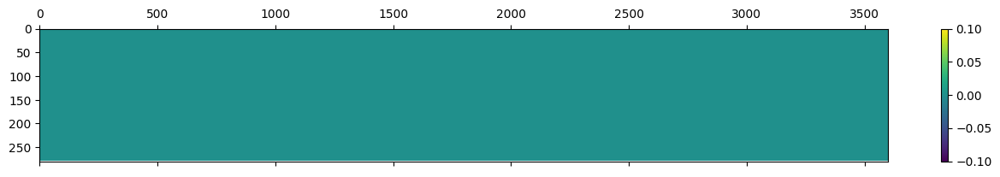

In [20]:
plt.matshow(d_diffuse.T, aspect='auto')
plt.colorbar()

In [21]:
# Plot map of diffuse emission
gsm = pygdsm.GlobalSkyModel2016(data_unit="TRJ", resolution='hi', freq_unit="Hz")

# Construct GSM datacube
hpmap = gsm.generate(freqs=freqs[0]*1e6)

invalid value encountered in log10


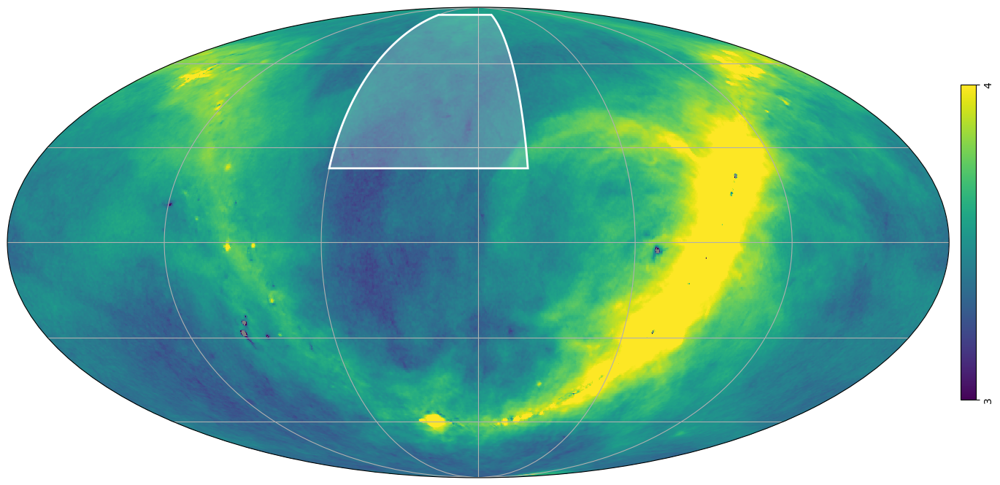

In [22]:
hp.projview(np.log10(hpmap), 
            coord=('G', 'E'), 
            rot=(-180.,0.,0.),
            flip='geo',
            min=3, 
            max=4, 
            graticule=True, 
            graticule_labels=False,
            cb_orientation="vertical",
            projection_type="mollweide")

#plt.axhline(-location.lat.deg, color='w', ls='dotted', lw=1.)
#plt.axvline(location.lat.deg, color='w', ls='dotted', lw=1.)

# Note the differenc ein coordinates between newprojplot and this
rect = patches.Rectangle((np.deg2rad(-60.), 
                          np.deg2rad(location.lat.deg-30.)),                         
                         height=np.deg2rad(60.),  
                         width=np.deg2rad(80.),  
                         ec='w', fc='w', alpha=0.2, zorder=99)
plt.gca().add_patch(rect)
rect = patches.Rectangle((np.deg2rad(-60.), 
                          np.deg2rad(location.lat.deg-30.)),                         
                         height=np.deg2rad(60.),  
                         width=np.deg2rad(80.),  
                         lw=2., ec='w', fc='none', alpha=1., zorder=99)
plt.gca().add_patch(rect)

plt.gcf().set_size_inches((16., 8.))

invalid value encountered in log10


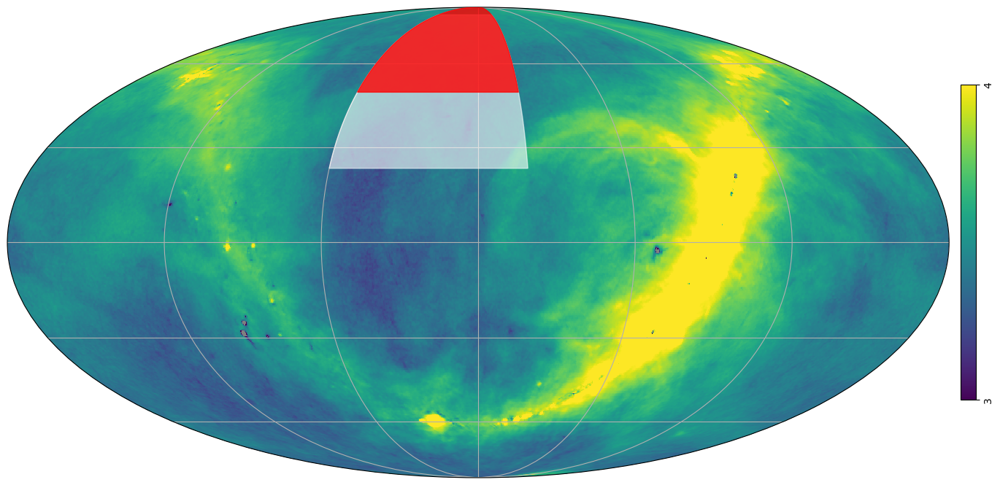

In [23]:
hp.projview(np.log10(hpmap), 
            coord=('G', 'E'), 
            rot=(-180.,0.,0.),
            flip='geo',
            min=3, 
            max=4, 
            graticule=True, 
            graticule_labels=False,
            cb_orientation="vertical",
            projection_type="mollweide")

#plt.axhline(-location.lat.deg, color='w', ls='dotted', lw=1.)
#plt.axvline(location.lat.deg, color='w', ls='dotted', lw=1.)

# Note the differenc ein coordinates between newprojplot and this
rect = patches.Rectangle((np.deg2rad(-60.), 
                          np.deg2rad(location.lat.deg-30.)),                         
                         height=np.deg2rad(60.),  
                         width=np.deg2rad(80.),  
                         ec='w', fc='w', alpha=0.6, zorder=99)
plt.gca().add_patch(rect)


rect = patches.Rectangle((np.deg2rad(-60.), 
                          np.deg2rad(78.9424-30.)),                         
                         height=np.deg2rad(41.),  
                         width=np.deg2rad(80.),  
                         ec='r', fc='r', alpha=0.8, zorder=99)
plt.gca().add_patch(rect)

#rect = patches.Rectangle((np.deg2rad(-60.), 
#                          np.deg2rad(location.lat.deg-30.)),                         
#                         height=np.deg2rad(60.),  
#                         width=np.deg2rad(80.),  
#                         lw=2., ec='w', fc='none', alpha=1., zorder=99)
#plt.gca().add_patch(rect)

plt.gcf().set_size_inches((16., 8.))

invalid value encountered in log10


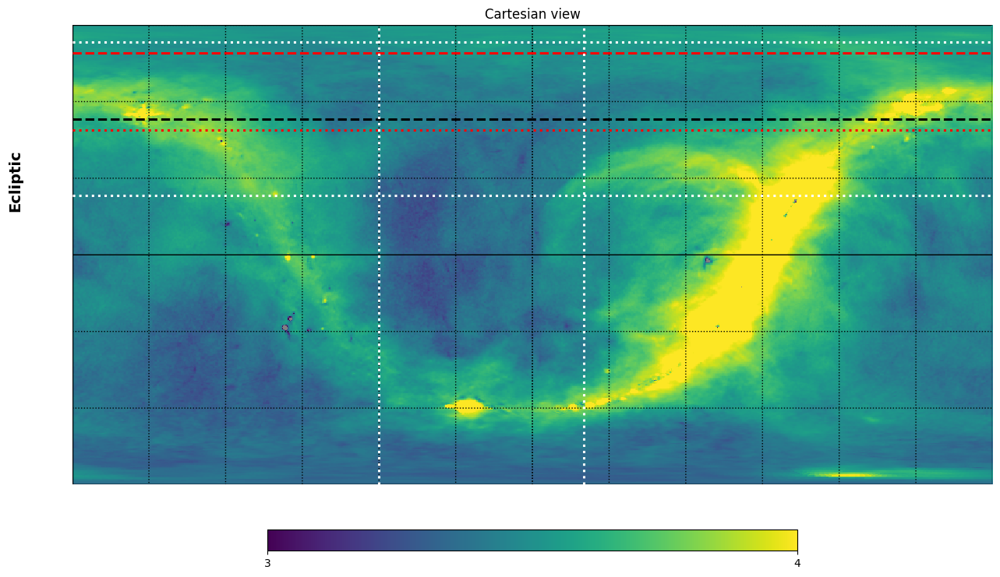

In [24]:
hp.cartview(np.log10(hpmap), 
            coord=('G', 'E'), 
            min=3, 
            max=4,
           rot=(-180.,0.,0.),
           flip='geo')
hp.graticule()

plt.axhline(location.lat.deg+30., color='w', ls='dotted', lw=2.2)
plt.axhline(location.lat.deg-30., color='w', ls='dotted', lw=2.2)
plt.axhline(location.lat.deg, color='k', ls='dashed', lw=2.2)


svalbard_lat = 78.9424
plt.axhline(svalbard_lat+30., color='r', ls='dotted', lw=2.2)
plt.axhline(svalbard_lat-30., color='r', ls='dotted', lw=2.2)
plt.axhline(svalbard_lat, color='r', ls='dashed', lw=2.2)


plt.axvline(-60., color='w', ls='dotted', lw=2.2)
plt.axvline(20., color='w', ls='dotted', lw=2.2)


plt.gcf().set_size_inches((16., 8.))

<a id='ptsrc-cat'></a>
## Point sources from catalogue

In [25]:
#import glob

In [26]:
# http://www.aoc.nrao.edu/~akimball/radiocat_1.1.shtml#download
#cat_files = glob.glob("/home/phil/hera/radiocat/*.csv")
#cat_files.sort()

In [27]:
#cat = []
#for i, fname in enumerate(cat_files):
#    print("Loading %d / %d" % (i+1, len(cat_files)))
#    _cat = np.genfromtxt(fname, skip_header=1, delimiter=',')
#    print(_cat.shape)
#    cat.append(_cat.T)

In [28]:
#cat = np.column_stack(cat)
#cat.shape

In [29]:
#plt.plot(cat[1], cat[2], 'r,', alpha=0.2)
#plt.gcf().set_size_inches((20., 10.))

<a id='ptsrc-synthetic'></a>
## Synthetic point source catalogue
GLEAM doesn't cover the northern sky well enough, but we can build a synthetic catalogue with similar properties, by resampling it.

In [30]:
# Load trimmed catalogue
cat_ra, cat_dec, cat_flux0, cat_beta = np.genfromtxt("catBC.txt").T

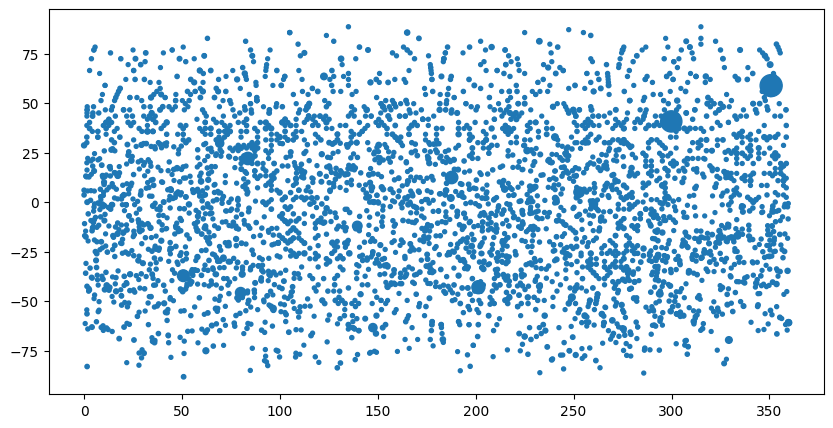

In [31]:
# Plot source positions
plt.scatter(cat_ra, cat_dec, s=2.*np.sqrt(10. + cat_flux0))

In [32]:
# Get approximate effective survey area from 3x standard deviation of RA and Dec
width_ra = 3.*np.std(cat_ra)
width_dec = 3.*np.std(cat_dec)
print(width_ra, width_dec)

# Get number density
cat_numdensity = cat_ra.size / (width_ra * width_dec) # approx. per deg^2
print("Number density: %8.4f / deg^2" % cat_numdensity)

309.8225719925748 115.99809536376006
Number density:   0.1078 / deg^2


New catalogue area: 4800.0000 deg^2
No. sources: 517


Text(0, 0.5, 'Dec [deg]')

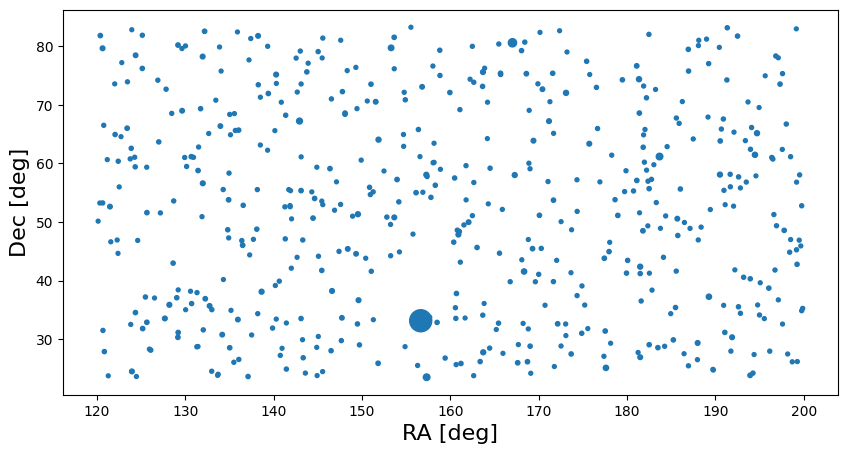

In [33]:
# Calculate new area, and therefore the number of sources (to match the number density)
ra_min, ra_max = 120., 200. # deg
dec_min, dec_max = 53.235 - 30., 53.235 + 30.
new_area = (ra_max - ra_min) * (dec_max - dec_min) # deg^2
new_Nptsrc = int(new_area * cat_numdensity)
print("New catalogue area: %8.4f deg^2" % new_area)
print("No. sources:", new_Nptsrc)

# Restrict source location on sky (close to zenith pointing)
ptsrc_ra = np.random.uniform(low=ra_min, high=ra_max, size=new_Nptsrc) # degrees
ptsrc_dec = np.random.uniform(low=dec_min, high=dec_max, size=new_Nptsrc) # degrees
ptsrc_dec[ptsrc_dec >= 90.] = 90. - (ptsrc_dec[ptsrc_dec >= 90.] - 90.)

# Select subsample of point sources at random, and use their flux and beta
idxs = np.arange(cat_ra.size)
sampled_idxs = np.random.choice(idxs, size=new_Nptsrc, replace=True)
ptsrc_flux0 = cat_flux0[sampled_idxs]
ptsrc_beta = cat_beta[sampled_idxs]

# Plot source positions in new source catalogue
plt.scatter(ptsrc_ra, ptsrc_dec, s=2.*np.sqrt(10. + ptsrc_flux0))
plt.xlabel("RA [deg]", fontsize=16)
plt.ylabel("Dec [deg]", fontsize=16)

Text(0.5, 0, '$\\log_{10} S$ [Jy]')

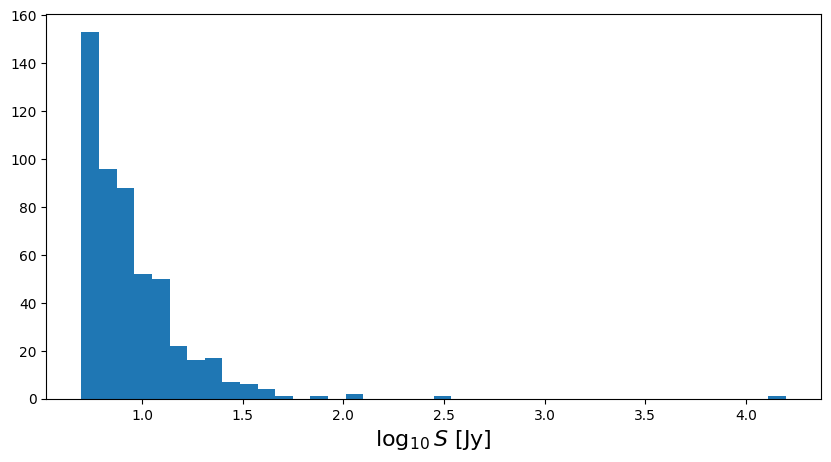

In [34]:
# Plot histogram
plt.subplot(111)
plt.hist(np.log10(ptsrc_flux0), bins=40)
#plt.yscale('log')
plt.xlabel("$\log_{10} S$ [Jy]", fontsize=16)

Text(0.5, 0, 'Point source spectral index')

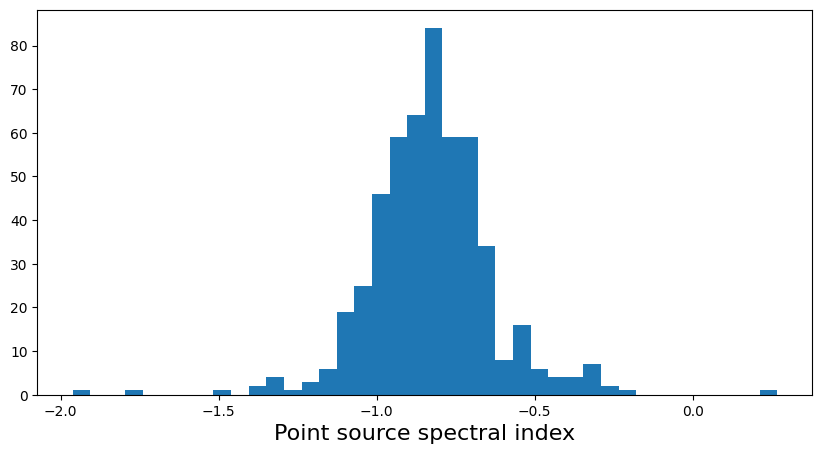

In [35]:
# Plot histogram
plt.subplot(111)
plt.hist(ptsrc_beta, bins=40)
plt.xlabel("Point source spectral index", fontsize=16.)

Done.


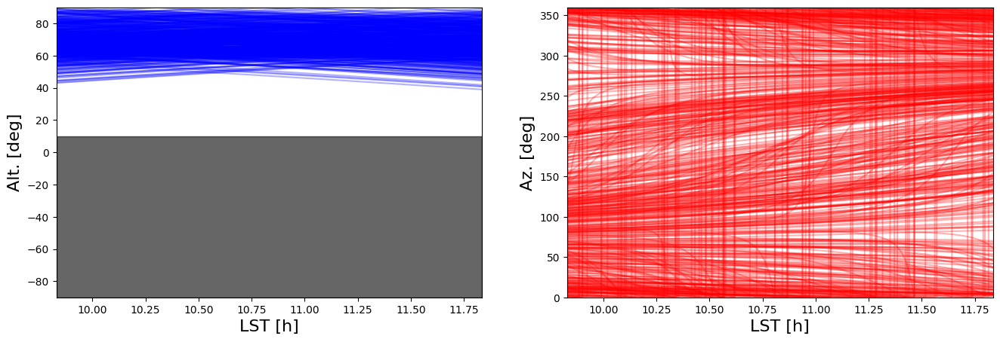

In [36]:
# Get altitude and azimuth vs LST
coords = SkyCoord(ra=ptsrc_ra*u.degree, dec=ptsrc_dec*u.degree, frame='icrs')

# Loop over times
alt, az = [], []
for tt in times:
    frame = AltAz(obstime=obstime + tt, location=location)
    _c = coords.transform_to(frame)
    alt.append(_c.alt.deg)
    az.append(_c.az.deg)
print("Done.")
alt = np.array(alt)
az = np.array(az)

# Plot altitude and azimuth vs LST
plt.subplot(121)
plt.plot(lsts*24./(2.*np.pi), alt, color='b', alpha=0.3)
plt.axhspan(xmin=0., xmax=1., ymin=-90., ymax=10., color='k', alpha=0.6)
plt.xlabel("LST [h]", fontsize=16)
plt.ylabel("Alt. [deg]", fontsize=16)
plt.xlim((lsts.min()*24./(2.*np.pi), lsts.max()*24./(2.*np.pi)))
plt.ylim((-90., 90.))

plt.subplot(122)
plt.plot(lsts*24./(2.*np.pi), az, color='r', alpha=0.3)
plt.xlabel("LST [h]", fontsize=16)
plt.ylabel("Az. [deg]", fontsize=16)
plt.xlim((lsts.min()*24./(2.*np.pi), lsts.max()*24./(2.*np.pi)))
plt.ylim((0., 360.))

plt.gcf().set_size_inches((16., 5.))

Beam FWHM:  35.8 deg


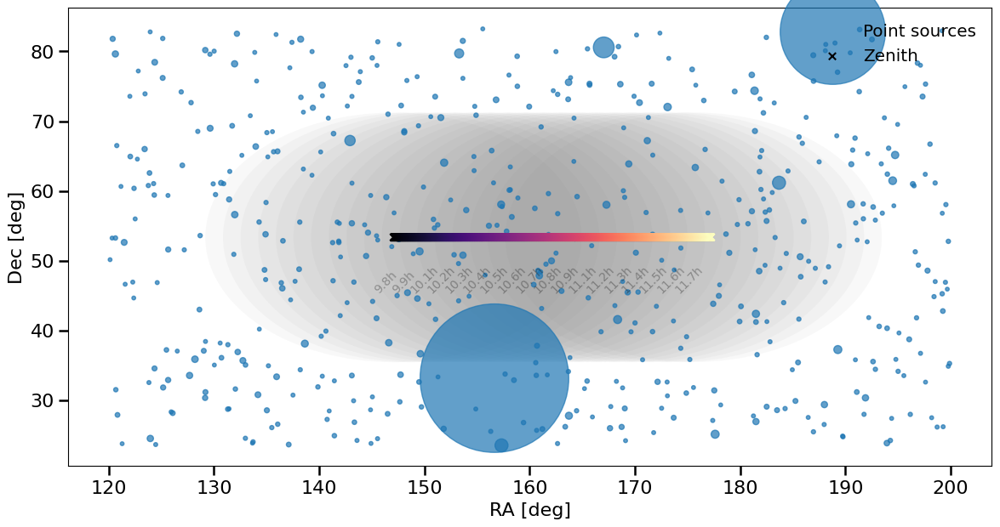

In [37]:
# Get RA/Dec track of zenith
zen_ra = []
zen_dec = []
for tt in times:
    zen = SkyCoord(alt=90.*u.deg, az=0.*u.deg, obstime=obstime + tt, location=location, frame='altaz')
    zen_ra.append(zen.icrs.ra.deg)
    zen_dec.append(zen.icrs.dec.deg)
zen_ra = np.array(zen_ra)
zen_dec = np.array(zen_dec)

# Plot locations of sources and zenith in equatorial coords
plt.subplot(111)
plt.scatter(ptsrc_ra, ptsrc_dec, s=5.+(ptsrc_flux0), label="Point sources", alpha=0.7)
plt.scatter(zen_ra, zen_dec, c=lsts, marker='x', label="Zenith", cmap='magma')

# Plot approx. beam FWHM
beam_fwhm = (astropy.constants.c.value/(freqs[0]*1e6) / 8.) * 180./np.pi
print("Beam FWHM: %5.1f deg" % beam_fwhm)
for i in np.arange(zen_ra.size)[::200]:
    circ = patches.Circle((zen_ra[i], zen_dec[i]), beam_fwhm/2., alpha=0.05, fc='gray', zorder=-100)
    plt.gca().add_patch(circ)
    if i % 2 == 0:
        plt.text(zen_ra[i] - 2., zen_dec[i] - 8., "%3.1fh" % (lsts[i]*24./(2.*np.pi)), rotation=45., alpha=0.3)

plt.legend(loc='upper right', frameon=False, prop={'size':'x-large'})
plt.xlabel("RA [deg]", fontsize=16)
plt.ylabel("Dec [deg]", fontsize=16)

#plt.ylim((-45., -15.))
plt.gca().tick_params(which='both', labelsize=16, size=8., width=1.8)

plt.gcf().set_size_inches((14., 7.))

<a id='ptsrc-sim'></a>
## Simulate point source visibilities
We use vis_cpu to simulate the point source visibilities

In [38]:
# Construct fluxes array by multiplying by powerlaw frequency dependence
fluxes = ptsrc_flux0[:,np.newaxis] * (freqs[np.newaxis,:] / 100.)**ptsrc_beta[:,np.newaxis]

In [39]:
# Simulate visibilities

try:
    beams[0].sim_start()
except:
    pass

t0 = time.time()
ptsrc_vis = vis_cpu.simulate_vis(ants=ants, 
                                 fluxes=fluxes, 
                                 ra=np.deg2rad(ptsrc_ra), 
                                 dec=np.deg2rad(ptsrc_dec), 
                                 freqs=freqs*1e6, 
                                 lsts=lsts, 
                                 beams=beams, 
                                 precision=2, 
                                 polarized=False,
                                 latitude=location.lat.rad)
print("Run took %3.1f sec" % (time.time() - t0))

try:
    beams[0].sim_end()
except:
    pass

Doing frequency 60000000.0
Time 1712345513.5161045


Doing frequency 60100358.42293907
Time 1712345813.2354429


Doing frequency 60200716.84587813
Time 1712345814.30773


Doing frequency 60301075.26881721
Time 1712345814.9949448


Doing frequency 60401433.69175627
Time 1712345815.6777656


Doing frequency 60501792.11469534
Time 1712345816.4451847


Doing frequency 60602150.53763441
Time 1712345817.1231613


Doing frequency 60702508.96057347
Time 1712345817.8031113


Doing frequency 60802867.38351254
Time 1712345818.4821908


Doing frequency 60903225.80645162
Time 1712345819.1644998


Doing frequency 61003584.22939068
Time 1712345819.8457284


Doing frequency 61103942.65232975
Time 1712345820.524863


Doing frequency 61204301.07526881
Time 1712345821.2036443


Doing frequency 61304659.49820788
Time 1712345821.904993


Doing frequency 61405017.92114695
Time 1712345822.6568615


Doing frequency 61505376.34408602
Time 1712345823.3368974


Doing frequency 61605734.76702509
Time 1712345824.0167918


Doing frequency 61706093.18996416
Time 1712345824.699338


Doing frequency 61806451.61290322
Time 1712345825.3811493


Doing frequency 61906810.03584229
Time 1712345826.0616841


Doing frequency 62007168.45878136
Time 1712345826.7410178


Doing frequency 62107526.88172043
Time 1712345827.4202428


Doing frequency 62207885.3046595
Time 1712345828.1876929


Doing frequency 62308243.72759856
Time 1712345828.8676927


Doing frequency 62408602.15053763
Time 1712345829.5468464


Doing frequency 62508960.5734767
Time 1712345830.2267501


Doing frequency 62609318.99641577
Time 1712345830.907083


Doing frequency 62709677.41935484
Time 1712345831.5932112


Doing frequency 62810035.8422939
Time 1712345832.2738967


Doing frequency 62910394.26523297
Time 1712345832.955459


Doing frequency 63010752.68817204
Time 1712345833.6408868


Doing frequency 63111111.11111111
Time 1712345834.3893232


Doing frequency 63211469.53405018
Time 1712345835.074541


Doing frequency 63311827.95698925
Time 1712345835.7627108


Doing frequency 63412186.37992831
Time 1712345836.4437296


Doing frequency 63512544.80286738
Time 1712345837.126045


Doing frequency 63612903.225806445
Time 1712345837.8054948


Doing frequency 63713261.64874552
Time 1712345838.4843392


Doing frequency 63813620.07168459
Time 1712345839.1638103


Doing frequency 63913978.49462365
Time 1712345839.8463266


Doing frequency 64014336.91756273
Time 1712345840.5246108


Doing frequency 64114695.3405018
Time 1712346139.6741204


Doing frequency 64215053.76344086
Time 1712346140.761723


Doing frequency 64315412.18637993
Time 1712346141.4455392


Doing frequency 64415770.609318994
Time 1712346142.1193323


Doing frequency 64516129.03225806
Time 1712346142.7954435


Doing frequency 64616487.45519713
Time 1712346143.4693587


Doing frequency 64716845.878136195
Time 1712346144.1442142


Doing frequency 64817204.301075265
Time 1712346144.819611


Doing frequency 64917562.724014334
Time 1712346145.493182


Doing frequency 65017921.1469534
Time 1712346146.1839232


Doing frequency 65118279.56989248
Time 1712346146.860034


Doing frequency 65218637.99283154
Time 1712346147.5355308


Doing frequency 65318996.41577061
Time 1712346148.2086437


Doing frequency 65419354.83870968
Time 1712346148.880087


Doing frequency 65519713.261648744
Time 1712346149.5568657


Doing frequency 65620071.684587814
Time 1712346150.2298005


Doing frequency 65720430.10752688
Time 1712346150.9039497


Doing frequency 65820788.530465946
Time 1712346151.576566


Doing frequency 65921146.953405015
Time 1712346152.2499382


Doing frequency 66021505.37634408
Time 1712346152.964588


Doing frequency 66121863.79928315
Time 1712346153.6417432


Doing frequency 66222222.22222223
Time 1712346154.3146172


Doing frequency 66322580.64516129
Time 1712346154.9880493


Doing frequency 66422939.06810036
Time 1712346155.6630988


Doing frequency 66523297.49103943
Time 1712346156.3395674


Doing frequency 66623655.913978495
Time 1712346157.0111263


Doing frequency 66724014.336917564
Time 1712346157.687676


Doing frequency 66824372.75985663
Time 1712346158.44728


Doing frequency 66924731.182795696
Time 1712346159.1190634


Doing frequency 67025089.605734766
Time 1712346159.7921324


Doing frequency 67125448.02867383
Time 1712346160.4627843


Doing frequency 67225806.45161289
Time 1712346161.1373403


Doing frequency 67326164.87455198
Time 1712346161.810085


Doing frequency 67426523.29749104
Time 1712346162.4831116


Doing frequency 67526881.7204301
Time 1712346163.1591766


Doing frequency 67627240.14336918
Time 1712346163.9194698


Doing frequency 67727598.56630825
Time 1712346164.5938594


Doing frequency 67827956.9892473
Time 1712346165.272797


Doing frequency 67928315.41218638
Time 1712346165.946981


Doing frequency 68028673.83512545
Time 1712346166.623343


Doing frequency 68129032.25806451
Time 1712346465.9234042


Doing frequency 68229390.68100359
Time 1712346466.9735286


Doing frequency 68329749.10394265
Time 1712346467.6553833


Doing frequency 68430107.52688172
Time 1712346468.3319004


Doing frequency 68530465.94982079
Time 1712346469.0179746


Doing frequency 68630824.37275986
Time 1712346469.691537


Doing frequency 68731182.79569893
Time 1712346470.3647318


Doing frequency 68831541.21863799
Time 1712346471.0436366


Doing frequency 68931899.64157706
Time 1712346471.7218125


Doing frequency 69032258.06451613
Time 1712346472.4652388


Doing frequency 69132616.48745519
Time 1712346473.1409795


Doing frequency 69232974.91039427
Time 1712346473.8232343


Doing frequency 69333333.33333333
Time 1712346474.5013978


Doing frequency 69433691.75627239
Time 1712346475.176937


Doing frequency 69534050.17921148
Time 1712346475.8603277


Doing frequency 69634408.60215054
Time 1712346476.5405214


Doing frequency 69734767.0250896
Time 1712346477.2201195


Doing frequency 69835125.44802868
Time 1712346477.8990924


Doing frequency 69935483.87096775
Time 1712346478.6595132


Doing frequency 70035842.29390681
Time 1712346479.3349922


Doing frequency 70136200.71684587
Time 1712346480.0098166


Doing frequency 70236559.13978495
Time 1712346480.6820638


Doing frequency 70336917.56272401
Time 1712346481.3548772


Doing frequency 70437275.98566307
Time 1712346482.0308838


Doing frequency 70537634.40860215
Time 1712346482.704311


Doing frequency 70637992.83154123
Time 1712346483.3782852


Doing frequency 70738351.25448029
Time 1712346484.1401243


Doing frequency 70838709.67741936
Time 1712346484.8231282


Doing frequency 70939068.10035843
Time 1712346485.4973726


Doing frequency 71039426.52329749
Time 1712346486.1748598


Doing frequency 71139784.94623657
Time 1712346486.8510804


Doing frequency 71240143.36917563
Time 1712346487.5298772


Doing frequency 71340501.79211469
Time 1712346488.2049558


Doing frequency 71440860.21505377
Time 1712346488.8847353


Doing frequency 71541218.63799283
Time 1712346489.5582707


Doing frequency 71641577.06093189
Time 1712346490.3043141


Doing frequency 71741935.48387097
Time 1712346490.9797108


Doing frequency 71842293.90681005
Time 1712346491.6530557


Doing frequency 71942652.3297491
Time 1712346492.3291714


Doing frequency 72043010.75268817
Time 1712346493.005913


Doing frequency 72143369.17562725
Time 1712346792.2286322


Doing frequency 72243727.59856631
Time 1712346793.3117337


Doing frequency 72344086.02150537
Time 1712346793.9870985


Doing frequency 72444444.44444445
Time 1712346794.6609051


Doing frequency 72544802.86738351
Time 1712346795.3402941


Doing frequency 72645161.29032257
Time 1712346796.0174782


Doing frequency 72745519.71326165
Time 1712346796.7339973


Doing frequency 72845878.13620073
Time 1712346797.408902


Doing frequency 72946236.55913979
Time 1712346798.087732


Doing frequency 73046594.98207887
Time 1712346798.7638552


Doing frequency 73146953.40501793
Time 1712346799.4408195


Doing frequency 73247311.82795699
Time 1712346800.116912


Doing frequency 73347670.25089605
Time 1712346800.7930827


Doing frequency 73448028.67383513
Time 1712346801.467221


Doing frequency 73548387.09677419
Time 1712346802.234783


Doing frequency 73648745.51971325
Time 1712346802.9102619


Doing frequency 73749103.94265233
Time 1712346803.585671


Doing frequency 73849462.36559139
Time 1712346804.2601917


Doing frequency 73949820.78853047
Time 1712346804.9365335


Doing frequency 74050179.21146955
Time 1712346805.6110735


Doing frequency 74150537.63440861
Time 1712346806.284474


Doing frequency 74250896.05734767
Time 1712346806.9615545


Doing frequency 74351254.48028675
Time 1712346807.6374748


Doing frequency 74451612.90322581
Time 1712346808.3981953


Doing frequency 74551971.32616487
Time 1712346809.0723991


Doing frequency 74652329.74910395
Time 1712346809.7470942


Doing frequency 74752688.17204301
Time 1712346810.4227893


Doing frequency 74853046.59498207
Time 1712346811.096144


Doing frequency 74953405.01792113
Time 1712346811.772835


Doing frequency 75053763.44086023
Time 1712346812.4468858


Doing frequency 75154121.86379929
Time 1712346813.1262858


Doing frequency 75254480.28673835
Time 1712346813.866118


Doing frequency 75354838.70967743
Time 1712346814.5620964


Doing frequency 75455197.13261649
Time 1712346815.2357392


Doing frequency 75555555.55555555
Time 1712346815.9183307


Doing frequency 75655913.97849463
Time 1712346816.5954251


Doing frequency 75756272.40143369
Time 1712346817.2681627


Doing frequency 75856630.82437275
Time 1712346817.943209


Doing frequency 75956989.24731183
Time 1712346818.6192765


Doing frequency 76057347.6702509
Time 1712346819.2943168


Doing frequency 76157706.09318997
Time 1712347118.5512993


Doing frequency 76258064.51612903
Time 1712347119.605658


Doing frequency 76358422.93906811
Time 1712347120.2875156


Doing frequency 76458781.36200717
Time 1712347120.9668753


Doing frequency 76559139.78494623
Time 1712347121.649085


Doing frequency 76659498.20788531
Time 1712347122.333374


Doing frequency 76759856.63082437
Time 1712347123.0134075


Doing frequency 76860215.05376343
Time 1712347123.6953623


Doing frequency 76960573.47670251
Time 1712347124.3779757


Doing frequency 77060931.89964157
Time 1712347125.0661163


Doing frequency 77161290.32258064
Time 1712347125.745523


Doing frequency 77261648.74551973
Time 1712347126.4229686


Doing frequency 77362007.16845877
Time 1712347127.104646


Doing frequency 77462365.59139785
Time 1712347127.8638926


Doing frequency 77562724.01433693
Time 1712347128.5458162


Doing frequency 77663082.43727599
Time 1712347129.2297146


Doing frequency 77763440.86021505
Time 1712347129.909535


Doing frequency 77863799.28315413
Time 1712347130.5939848


Doing frequency 77964157.70609319
Time 1712347131.2751982


Doing frequency 78064516.12903225
Time 1712347131.9544818


Doing frequency 78164874.55197132
Time 1712347132.6402414


Doing frequency 78265232.9749104
Time 1712347133.3859515


Doing frequency 78365591.39784947
Time 1712347134.091409


Doing frequency 78465949.82078852
Time 1712347134.783657


Doing frequency 78566308.24372761
Time 1712347135.4696758


Doing frequency 78666666.66666667
Time 1712347136.1563473


Doing frequency 78767025.08960573
Time 1712347136.836328


Doing frequency 78867383.51254481
Time 1712347137.520178


Doing frequency 78967741.93548387
Time 1712347138.2062538


Doing frequency 79068100.35842294
Time 1712347138.8863347


Doing frequency 79168458.78136201
Time 1712347139.658791


Doing frequency 79268817.20430107
Time 1712347140.3439665


Doing frequency 79369175.62724014
Time 1712347141.024491


Doing frequency 79469534.05017921
Time 1712347141.7031555


Doing frequency 79569892.47311828
Time 1712347142.3806431


Doing frequency 79670250.89605735
Time 1712347143.0657473


Doing frequency 79770609.31899641
Time 1712347143.7497475


Doing frequency 79870967.74193549
Time 1712347144.436918


Doing frequency 79971326.16487455
Time 1712347145.1956973


Doing frequency 80071684.58781362
Time 1712347145.879044


Doing frequency 80172043.0107527
Time 1712347445.0509253


Doing frequency 80272401.43369175
Time 1712347446.1345212


Doing frequency 80372759.85663082
Time 1712347446.8178556


Doing frequency 80473118.2795699
Time 1712347447.4978232


Doing frequency 80573476.70250897
Time 1712347448.1766226


Doing frequency 80673835.12544802
Time 1712347448.8558998


Doing frequency 80774193.54838711
Time 1712347449.6222012


Doing frequency 80874551.97132617
Time 1712347450.3028727


Doing frequency 80974910.39426523
Time 1712347450.9811542


Doing frequency 81075268.8172043
Time 1712347451.6593184


Doing frequency 81175627.24014337
Time 1712347452.3389025


Doing frequency 81275985.66308244
Time 1712347453.0144572


Doing frequency 81376344.0860215
Time 1712347453.6927834


Doing frequency 81476702.50896057
Time 1712347454.3726273


Doing frequency 81577060.93189964
Time 1712347455.1449616


Doing frequency 81677419.35483871
Time 1712347455.8257654


Doing frequency 81777777.77777778
Time 1712347456.5065303


Doing frequency 81878136.20071685
Time 1712347457.1839647


Doing frequency 81978494.62365592
Time 1712347457.866242


Doing frequency 82078853.04659499
Time 1712347458.549228


Doing frequency 82179211.46953405
Time 1712347459.2285964


Doing frequency 82279569.89247312
Time 1712347459.9089546


Doing frequency 82379928.3154122
Time 1712347460.5890827


Doing frequency 82480286.73835126
Time 1712347461.3546379


Doing frequency 82580645.16129032
Time 1712347462.03357


Doing frequency 82681003.58422938
Time 1712347462.7131913


Doing frequency 82781362.00716847
Time 1712347463.3942842


Doing frequency 82881720.43010752
Time 1712347464.07424


Doing frequency 82982078.8530466
Time 1712347464.7531075


Doing frequency 83082437.27598567
Time 1712347465.4323018


Doing frequency 83182795.69892474
Time 1712347466.112081


Doing frequency 83283154.1218638
Time 1712347466.8650024


Doing frequency 83383512.54480287
Time 1712347467.544255


Doing frequency 83483870.96774194
Time 1712347468.221311


Doing frequency 83584229.390681
Time 1712347468.9004025


Doing frequency 83684587.81362008
Time 1712347469.5777135


Doing frequency 83784946.23655914
Time 1712347470.2550466


Doing frequency 83885304.65949821
Time 1712347470.9346874


Doing frequency 83985663.08243728
Time 1712347471.6126277


Doing frequency 84086021.50537635
Time 1712347472.2889557


Doing frequency 84186379.92831542
Time 1712347771.4975247


Doing frequency 84286738.35125448
Time 1712347772.5577974


Doing frequency 84387096.77419356
Time 1712347773.2358005


Doing frequency 84487455.19713262
Time 1712347773.9146137


Doing frequency 84587813.62007168
Time 1712347774.5949478


Doing frequency 84688172.04301076
Time 1712347775.2710385


Doing frequency 84788530.46594982
Time 1712347775.94783


Doing frequency 84888888.88888888
Time 1712347776.6242018


Doing frequency 84989247.31182796
Time 1712347777.3013422


Doing frequency 85089605.73476702
Time 1712347777.9836526


Doing frequency 85189964.1577061
Time 1712347778.6613808


Doing frequency 85290322.58064517
Time 1712347779.3366241


Doing frequency 85390681.00358424
Time 1712347780.0148473


Doing frequency 85491039.4265233
Time 1712347780.692357


Doing frequency 85591397.84946238
Time 1712347781.3690648


Doing frequency 85691756.27240144
Time 1712347782.0456796


Doing frequency 85792114.6953405
Time 1712347782.724815


Doing frequency 85892473.11827956
Time 1712347783.399368


Doing frequency 85992831.54121864
Time 1712347784.0728846


Doing frequency 86093189.9641577
Time 1712347784.742341


Doing frequency 86193548.38709676
Time 1712347785.4209301


Doing frequency 86293906.81003585
Time 1712347786.098472


Doing frequency 86394265.23297492
Time 1712347786.7744517


Doing frequency 86494623.65591398
Time 1712347787.4533193


Doing frequency 86594982.07885306
Time 1712347788.1304276


Doing frequency 86695340.50179212
Time 1712347788.8067038


Doing frequency 86795698.92473118
Time 1712347789.4773328


Doing frequency 86896057.34767026
Time 1712347790.15013


Doing frequency 86996415.77060932
Time 1712347790.8268769


Doing frequency 87096774.19354838
Time 1712347791.501624


Doing frequency 87197132.61648746
Time 1712347792.173154


Doing frequency 87297491.03942652
Time 1712347792.845454


Doing frequency 87397849.4623656
Time 1712347793.5882072


Doing frequency 87498207.88530464
Time 1712347794.2636757


Doing frequency 87598566.30824374
Time 1712347794.9383109


Doing frequency 87698924.7311828
Time 1712347795.6139262


Doing frequency 87799283.15412186
Time 1712347796.2905343


Doing frequency 87899641.57706094
Time 1712347796.9651093


Doing frequency 88000000.0
Time 1712347797.6396017


Run took 2284.9 sec


Text(0.5, 0, 'LST [h]')

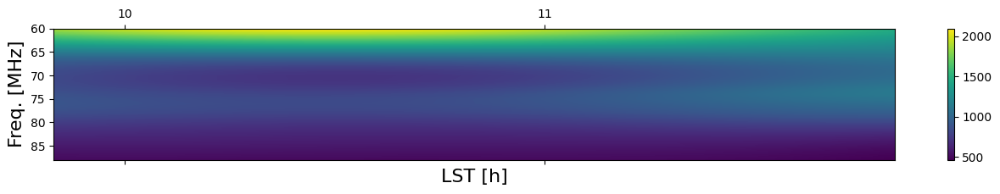

In [40]:
extent = [lsts.min()*24./(2.*np.pi), lsts.max()*24./(2.*np.pi),
          freqs.max(), freqs.min()]
plt.matshow(np.abs(ptsrc_vis[:,:,0,0]), aspect='auto', extent=extent)
plt.colorbar()
plt.ylabel("Freq. [MHz]", fontsize=16.)
plt.xlabel("LST [h]", fontsize=16.)

Casting complex values to real discards the imaginary part


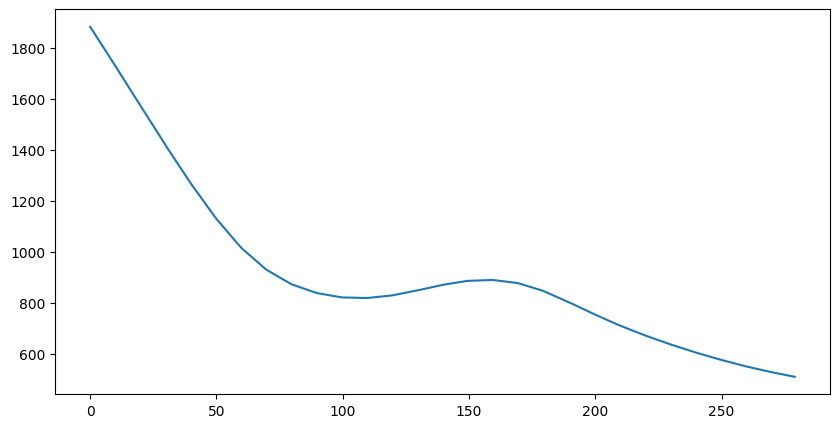

In [41]:
plt.plot(ptsrc_vis[:,0,0,0])

<a id='21cm'></a>
## 21cm signal

In [42]:
def T21cm_profile(freqs, Tb0=10e-3, centre=75., width=5., depth=100e-3, spindex=4):
    return Tb0 * np.ones_like(freqs) \
          - depth * np.exp(-0.5 * ((freqs-centre)/width)**(2*spindex))

underflow encountered in exp
underflow encountered in multiply


Text(0, 0.5, 'Tb [K]')

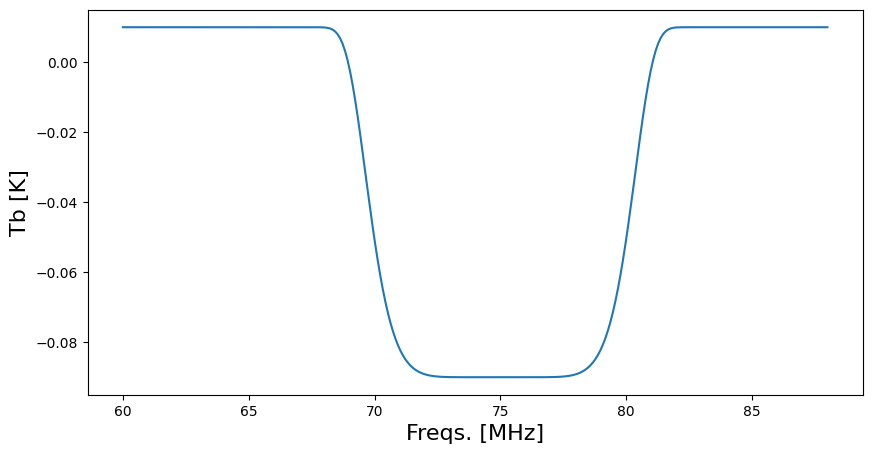

In [43]:
Tb = T21cm_profile(freqs, Tb0=10e-3, centre=75., width=5., depth=100e-3, spindex=4)

plt.subplot(111)
plt.plot(freqs, Tb)

plt.xlabel("Freqs. [MHz]", fontsize=16)
plt.ylabel("Tb [K]", fontsize=16)

<a id='ndiode'></a>
## Noise diode

**HG** ndiode_signal and ndiode_alwayson are used once each in later sections.

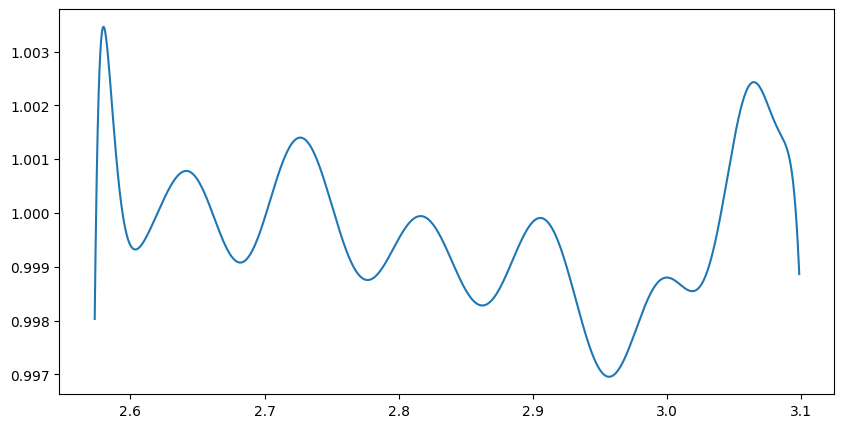

In [44]:
# Construct random Chebyshev model for noise diode time-dep. amplitude
ndiode_shape = 1. + chebyshev_model(lsts, ndiode_ncoeffs, ndiode_ripple_factor)

# Plot noise diode amplitude
plt.subplot(111)
plt.plot(lsts, ndiode_shape)

(0.99, 1.01)

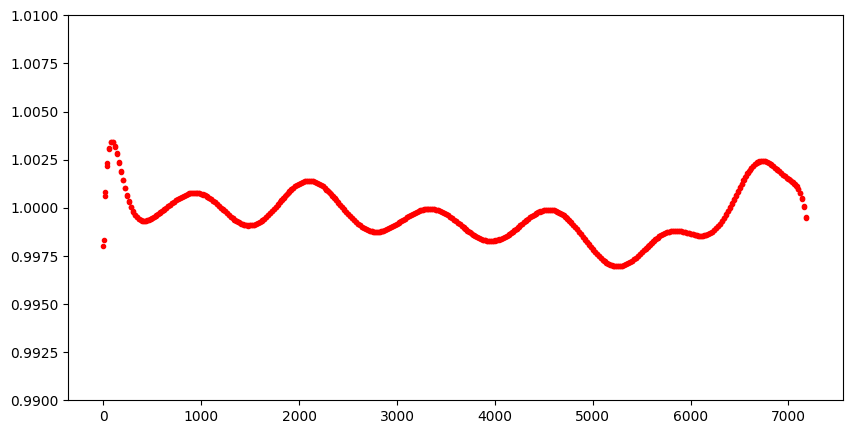

In [45]:
# Noise diode waveform
tt = np.arange(lsts.size) * dt
ndiode_time_signal = np.zeros(tt.size)

# Switch on for given cadence and duration
for i in range(ndiode_duration):
    ndiode_time_signal[i::ndiode_cadence] = 1.
ndiode_time_signal *= ndiode_shape
    
plt.plot(tt, ndiode_time_signal, 'r.')
plt.ylim((0.99, 1.01))

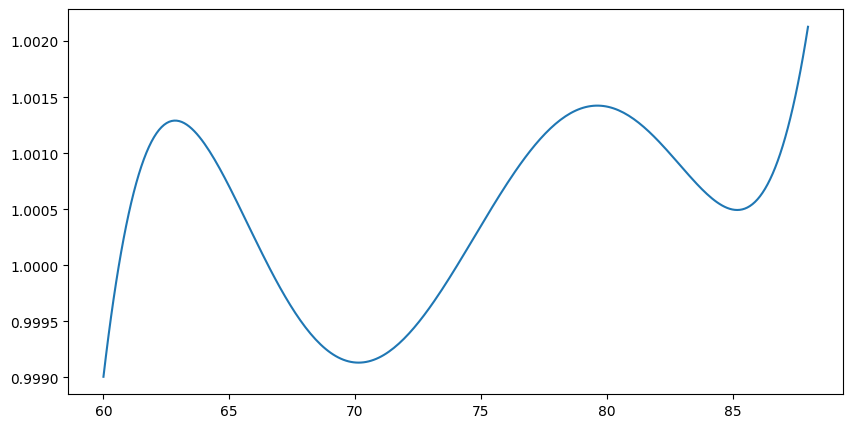

In [46]:
# Noise diode bandpass
ndiode_bandpass_shape = 1. + chebyshev_model(freqs, ndiode_bandpass_ncoeffs, ndiode_bandpass_ripple_factor)

# Plot noise diode bandpass
plt.subplot(111)
plt.plot(freqs, ndiode_bandpass_shape)

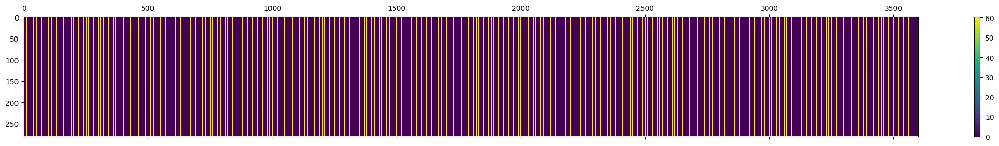

In [47]:
# Combined noise diode process
ndiode_signal = Tdiode * ndiode_bandpass_shape[np.newaxis,:] * ndiode_time_signal[:,np.newaxis]
ndiode_mask = np.zeros(ndiode_signal.shape)
ndiode_mask[ndiode_signal > 0.] = 1.

# Plot (suffers from aliasing!)
plt.matshow(ndiode_signal.T, aspect='auto') #, vmin=0.95, vmax=1.05)
plt.colorbar()
plt.gcf().set_size_inches((28., 3.))

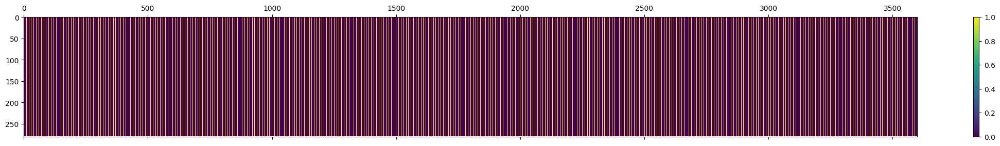

In [48]:
plt.matshow(ndiode_mask.T, aspect='auto') #, vmin=0.95, vmax=1.05)
plt.colorbar()
plt.gcf().set_size_inches((28., 3.))

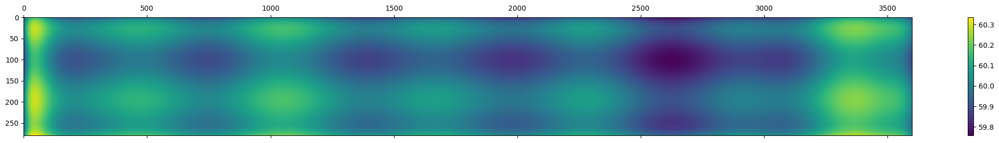

In [49]:
# Keep a noise diode waterfall that doesn't have the on/off cycles
ndiode_alwayson = Tdiode * ndiode_bandpass_shape[np.newaxis,:] * ndiode_shape[:,np.newaxis]

plt.matshow(ndiode_alwayson.T, aspect='auto')
plt.colorbar()
plt.gcf().set_size_inches((28., 3.))

<a id='skycal'></a>
## Combined sky and calibrator signals

**HG** 
Why "input_signal = sky_signal + noise + ndiode_signal"   why include ndiode_signal.

Text(0, 0.5, 'Power beam solid angle [ster.]')

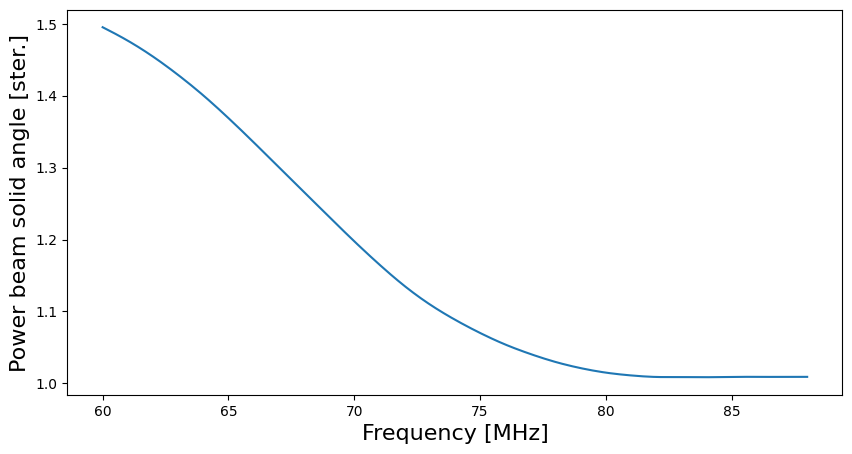

In [50]:
# Calculate beam solid angle vs. frequency (use the square of the beam to get the 'power' beam)

beam_squared = True
try:
    if beams[0].beam_type == "power":
        beam_squared = False
except:
    pass
    
omega_beam = get_beam_area(beams[0], freqs, beam_squared=beam_squared, naz=500, nza=500)

plt.subplot(111)
plt.plot(freqs, omega_beam)
plt.xlabel("Frequency [MHz]", fontsize=16)
plt.ylabel("Power beam solid angle [ster.]", fontsize=16)

In [51]:
# Total signal (convert Jy to T_RJ where needed)
sky_signal = Jy_to_TRJ(ptsrc_vis[:,:,0,0].T.real + d_diffuse, 
                       freqs, 
                       omega=omega_beam) \
           + Tb[np.newaxis,:]

(0.0001, 1000.0)

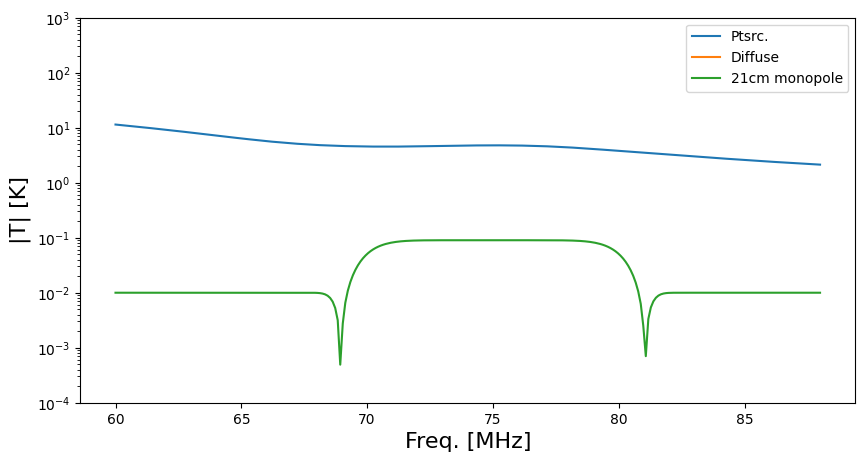

In [52]:
# Plot spectra at single time
plt.subplot(111)
plt.plot(freqs, Jy_to_TRJ(ptsrc_vis[:,:,0,0].T.real, freqs, omega=omega_beam)[20,:], label="Ptsrc.")
plt.plot(freqs, Jy_to_TRJ(d_diffuse, freqs, omega=omega_beam)[20,:], label="Diffuse")
plt.plot(freqs, np.abs(Tb), label="21cm monopole")

plt.legend(loc='upper right')

plt.xlabel("Freq. [MHz]", fontsize=16)
plt.ylabel("|T| [K]", fontsize=16)
plt.yscale('log')
plt.ylim((1e-4, 1e3))

In [53]:
def noise_realisation(Tsys, freqs, dt):
    """
    Generate a random thermal noise realisation (mean zero) using 
    the radiometer equation, for a given system temperature.
    
    Parameters:
        Tsys (array_like):
            System temperature, in K.
        freqs (array_like):
            Frequency array, in MHz.
        dt (float):
            Integration time per time sample, in sec.
    
    Returns:
        noise (array_like):
            Random noise realisation, in K.
    """
    # Channel bandwidth
    dnu = (freqs[1] - freqs[0]) * 1e6 # Hz
    
    # Noise rms
    sigmaT = Tsys / np.sqrt(dnu * dt)
    
    # Generate noise
    noise = sigmaT * np.random.randn(*Tsys.shape)
    return noise

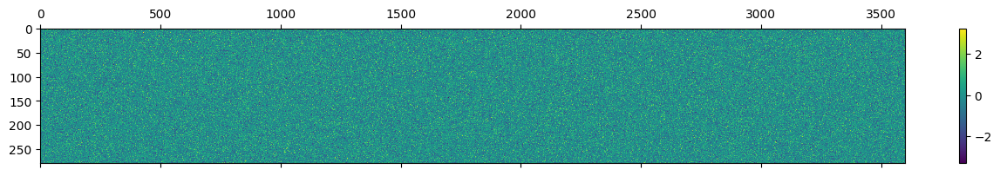

In [54]:
# Calculate noise rms using the radiometer equation
noise = noise_realisation(sky_signal + Tinstrument, freqs, dt)

# Plot noise
plt.matshow(noise.T, aspect='auto')
plt.colorbar()

(3600, 280)


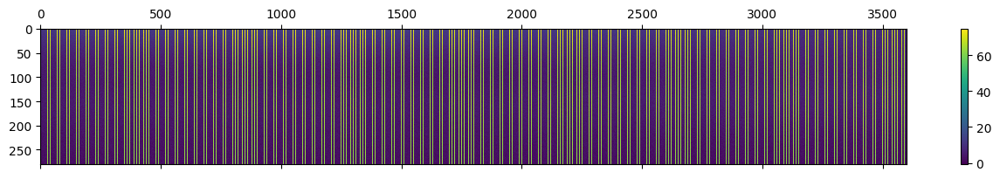

In [55]:
# Combine signal and noise
input_signal = sky_signal + noise + ndiode_signal
print(input_signal.shape)
plt.matshow(input_signal.T, aspect='auto')
plt.colorbar()

Text(0, 0.5, 'Tobs [K]')

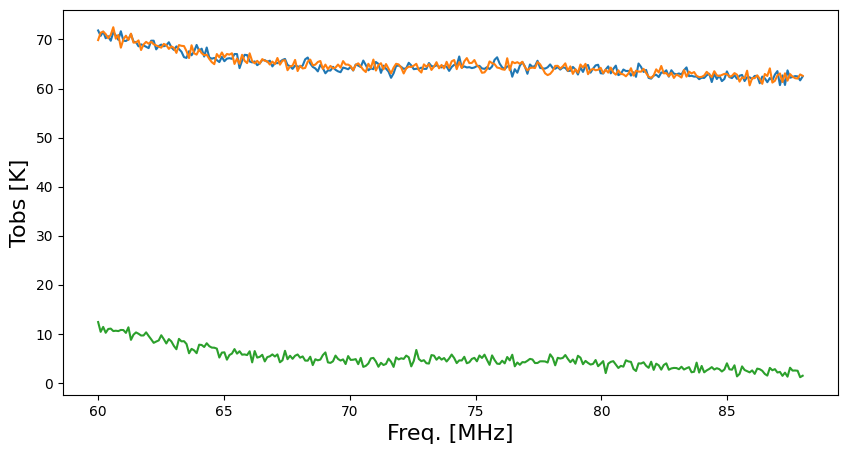

In [56]:
# Plot input signal at a single time
plt.plot(freqs, input_signal[0])
plt.plot(freqs, input_signal[1])
plt.plot(freqs, input_signal[2])

plt.xlabel("Freq. [MHz]", fontsize=16.)
plt.ylabel("Tobs [K]", fontsize=16.)

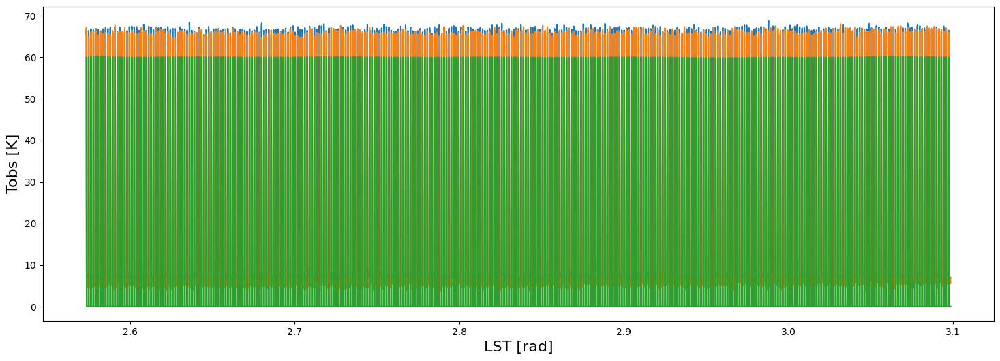

In [57]:
# Plot example time series in a few frequency channels
plt.plot(lsts, input_signal[:,50])
plt.plot(lsts, input_signal[:,60])

plt.plot(lsts, ndiode_signal[:,50])

plt.xlabel("LST [rad]", fontsize=16.)
plt.ylabel("Tobs [K]", fontsize=16.)
plt.gcf().set_size_inches((18., 6.))

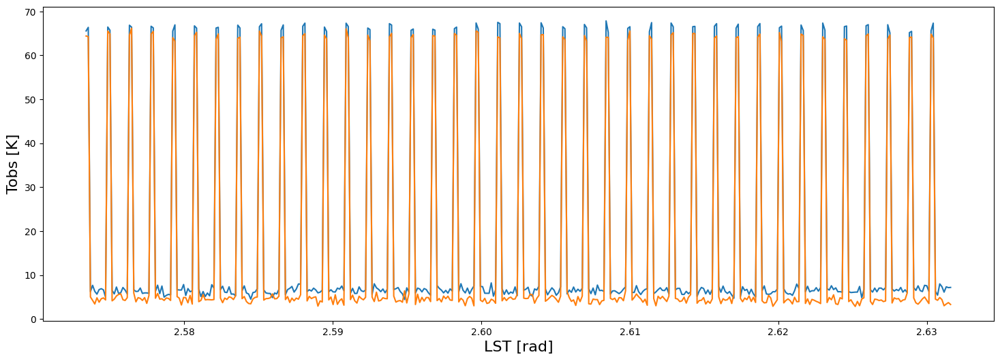

In [58]:
n = 400
plt.plot(lsts[:n], input_signal[:n,50])
plt.plot(lsts[:n], input_signal[:n,120])

plt.xlabel("LST [rad]", fontsize=16.)
plt.ylabel("Tobs [K]", fontsize=16.)
plt.gcf().set_size_inches((18., 6.))

<a id='loads'></a>
## Calibration loads

In [59]:
# Standard loads with freq./time-dependent ripples
load1_signal = Tload1 \
             * (1. + chebyshev_model(lsts, load1_time_ncoeffs, load1_time_amp)[:,np.newaxis]) \
             * (1. + chebyshev_model(freqs, load1_freq_ncoeffs, load1_freq_amp)[np.newaxis,:])

load2_signal = Tload2 \
             * (1. + chebyshev_model(lsts, load2_time_ncoeffs, load2_time_amp)[:,np.newaxis]) \
             * (1. + chebyshev_model(freqs, load2_freq_ncoeffs, load2_freq_amp)[np.newaxis,:])

In [60]:
# Generate thermal noise for calibration loads
noise_load1 = noise_realisation(load1_signal + Tinstrument, freqs, dt)
noise_load2 = noise_realisation(load2_signal + Tinstrument, freqs, dt)

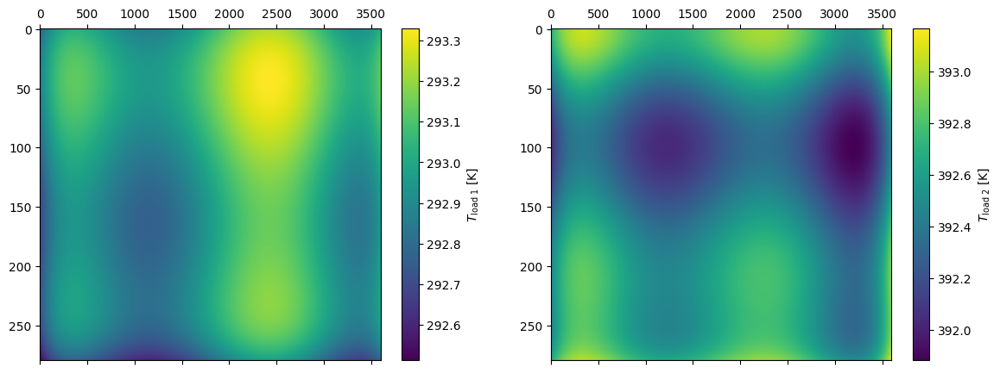

In [61]:
plt.subplot(121)
plt.matshow(load1_signal.T, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{{\rm load}~1}$ [K]")

plt.subplot(122)
plt.matshow(load2_signal.T, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{{\rm load}~2}$ [K]")

plt.gcf().set_size_inches((14., 5.))

In [62]:
# Add noise to calibration load signals
load1 = load1_signal + noise_load1
load2 = load2_signal + noise_load2

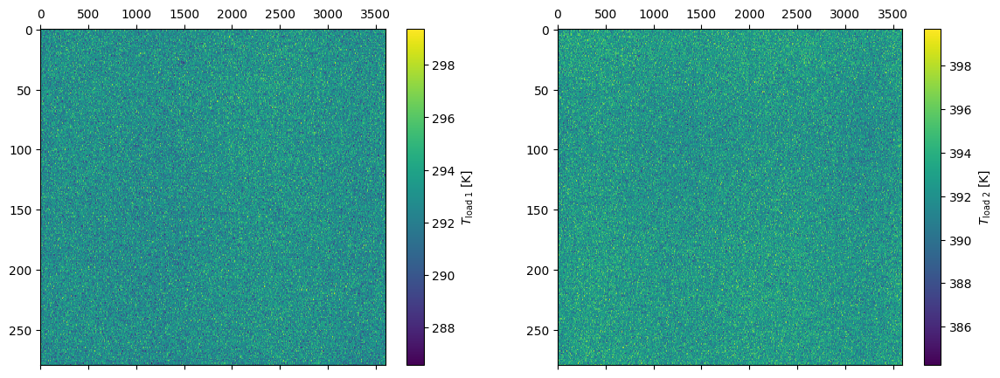

In [63]:
plt.subplot(121)
plt.matshow(load1.T, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{{\rm load}~1}$ [K]")

plt.subplot(122)
plt.matshow(load2.T, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{{\rm load}~2}$ [K]")

plt.gcf().set_size_inches((14., 5.))

<a id='reflections'></a>
## Reflections

We use the noise-wave formalism to model the effect of reflections on the measured signal. The model itself is based on Eq. 6 of https://arxiv.org/abs/2011.14052:

$P_{\rm src} = g_{\rm sys} \left [ T_{\rm src} (1 - |\Gamma_{\rm src}|^2) |\kappa|^2 + T_{\rm unc} |\Gamma_{\rm src}|^2 |\kappa|^2 + T_{\rm cos} {\rm Re}(\Gamma_{\rm src} \kappa) + T_{\rm sin} {\rm Im}(\Gamma_{\rm src} \kappa) + T_0 \right ]$
where
$\kappa = \frac{\sqrt{1 - |\Gamma_{\rm rec}|^2}}{1 - \Gamma_{\rm src}\Gamma_{\rm rec}}$.

In [64]:
prefix = prefix+"_refl"

def apply_noise_wave_params(Tsrc, Gamma_src, Gamma_rec, Tunc, Tcos, Tsin, Toffset):
    """
    Apply the parameters of the noise-wave formalism to an input source temperature.
    Units of the T parameters are K. All quantities are expected to have shape 
    (Ntimes, Nfreqs.)
    
    See Eq. 6 of https://arxiv.org/abs/2011.14052 for definitions.
    
    Parameters:
        Tsrc (array_like):
            True ("calibrated") temperature from the input source.
        Gamma_src (array_like):
            Complex reflection coefficient from the input source.
        Gamma_rec (array_like):
            Complex reflection coefficient to the receiver.
        Tunc (array_like):
            Temperature of the uncorrelated part of the reflection.
        Tcos (array_like):
            Cosine component of the correlated part of the reflection.
        Tsin (array_like):
            Sine component of the correlated part of the reflection.
        Toffset(array_like):
            Overall offset temperature in the signal chain.
    
    Returns:
        Prec (array_like):
            Observed power after passing through the signal chain.
    """
    # Complex kappa factor
    kappa = np.sqrt(1. - np.abs(Gamma_rec)**2.) / (1. - Gamma_src * Gamma_rec)
    
    # Calculate sum of noise wave effects
    Prec = Tsrc * (1. - np.abs(Gamma_src)**2.) * np.abs(kappa)**2. \
         + Tunc * np.abs(Gamma_src)**2. * np.abs(kappa)**2. \
         + Tcos * np.real(Gamma_src * kappa) \
         + Tsin * np.imag(Gamma_src * kappa) \
         + Toffset
    return Prec

In [65]:
# Gamma is in the range [-1, +1], with 0=no reflection.
Gamma_src_re = Gamma_src_re0 \
             * (1. + chebyshev_model(lsts, Gamma_src_time_ncoeffs, Gamma_src_time_amp)[:,np.newaxis]) \
             * (1. + chebyshev_model(freqs, Gamma_src_freq_ncoeffs, Gamma_src_freq_amp)[np.newaxis,:])

Gamma_src_im = Gamma_src_im0 \
             * (1. + chebyshev_model(lsts, Gamma_src_time_ncoeffs, Gamma_src_time_amp)[:,np.newaxis]) \
             * (1. + chebyshev_model(freqs, Gamma_src_freq_ncoeffs, Gamma_src_freq_amp)[np.newaxis,:])

Gamma_rec_re = Gamma_rec_re0 \
             * (1. + chebyshev_model(lsts, Gamma_rec_time_ncoeffs, Gamma_rec_time_amp)[:,np.newaxis]) \
             * (1. + chebyshev_model(freqs, Gamma_rec_freq_ncoeffs, Gamma_rec_freq_amp)[np.newaxis,:])

Gamma_rec_im = Gamma_rec_im0 \
             * (1. + chebyshev_model(lsts, Gamma_rec_time_ncoeffs, Gamma_rec_time_amp)[:,np.newaxis]) \
             * (1. + chebyshev_model(freqs, Gamma_rec_freq_ncoeffs, Gamma_rec_freq_amp)[np.newaxis,:])

# Combine into complex quantities
Gamma_src = Gamma_src_re + 1.j * Gamma_src_im
Gamma_rec = Gamma_rec_re + 1.j * Gamma_rec_im

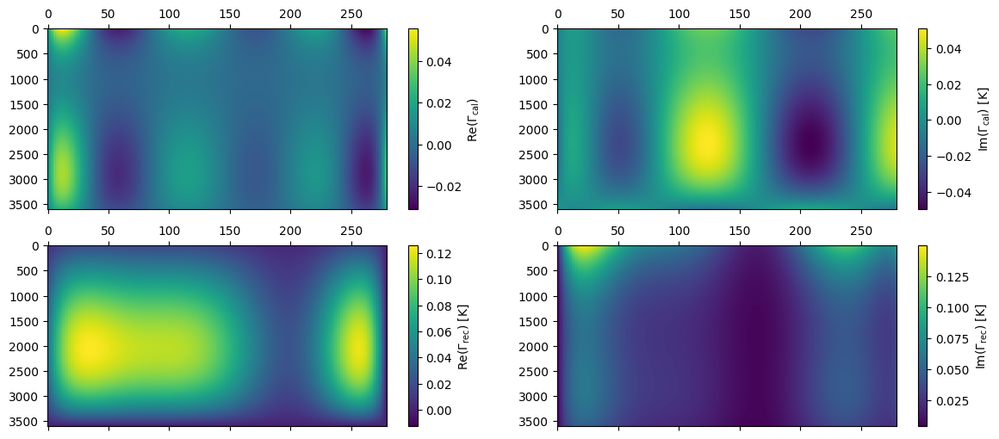

In [66]:
# Plot noise wave reflection parameters
plt.subplot(221)
plt.matshow(Gamma_src_re, aspect='auto', fignum=False)
plt.colorbar(label=r"${\rm Re}(\Gamma_{\rm cal})$")

plt.subplot(222)
plt.matshow(Gamma_src_im, aspect='auto', fignum=False)
plt.colorbar(label=r"${\rm Im}(\Gamma_{\rm cal})$ [K]")

plt.subplot(223)
plt.matshow(Gamma_rec_re, aspect='auto', fignum=False)
plt.colorbar(label=r"${\rm Re}(\Gamma_{\rm rec})$ [K]")

plt.subplot(224)
plt.matshow(Gamma_rec_im, aspect='auto', fignum=False)
plt.colorbar(label=r"${\rm Im}(\Gamma_{\rm rec})$ [K]")

plt.gcf().set_size_inches((14., 6.))

In [67]:
# See Sect. 3.1 of https://arxiv.org/abs/2011.14052 for representative numbers
T_unc = Tunc0 \
      * (1. + chebyshev_model(lsts, Tunc_time_ncoeffs, Tunc_time_amp)[:,np.newaxis]) \
      * (1. + chebyshev_model(freqs, Tunc_freq_ncoeffs, Tunc_freq_amp)[np.newaxis,:])

T_cos = Tcos0 \
      * (1. + chebyshev_model(lsts, Tcos_time_ncoeffs, Tcos_time_amp)[:,np.newaxis]) \
      * (1. + chebyshev_model(freqs, Tcos_freq_ncoeffs, Tcos_freq_amp)[np.newaxis,:])

T_sin = Tsin0 \
      * (1. + chebyshev_model(lsts, Tsin_time_ncoeffs, Tsin_time_amp)[:,np.newaxis]) \
      * (1. + chebyshev_model(freqs, Tsin_freq_ncoeffs, Tsin_freq_amp)[np.newaxis,:])

T_offset = Toffset0 \
      * (1. + chebyshev_model(lsts, Toffset_time_ncoeffs, Toffset_time_amp)[:,np.newaxis]) \
      * (1. + chebyshev_model(freqs, Toffset_freq_ncoeffs, Toffset_freq_amp)[np.newaxis,:])

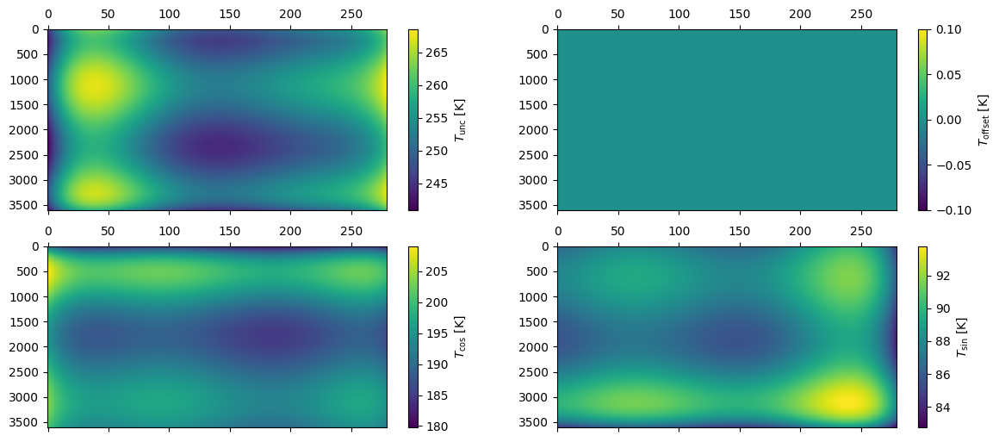

In [68]:
# Plot noise wave temperature parameters
plt.subplot(221)
plt.matshow(T_unc, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{\rm unc}$ [K]")

plt.subplot(222)
plt.matshow(T_offset, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{\rm offset}$ [K]")

plt.subplot(223)
plt.matshow(T_cos, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{\rm cos}$ [K]")

plt.subplot(224)
plt.matshow(T_sin, aspect='auto', fignum=False)
plt.colorbar(label=r"$T_{\rm sin}$ [K]")

plt.gcf().set_size_inches((14., 6.))

In [69]:
# Apply noise wave effects to sky signal
P_rec = apply_noise_wave_params(Tsrc=input_signal, 
                                Gamma_src=Gamma_src, 
                                Gamma_rec=Gamma_rec, 
                                Tunc=T_unc, 
                                Tcos=T_cos, 
                                Tsin=T_sin, 
                                Toffset=T_offset)

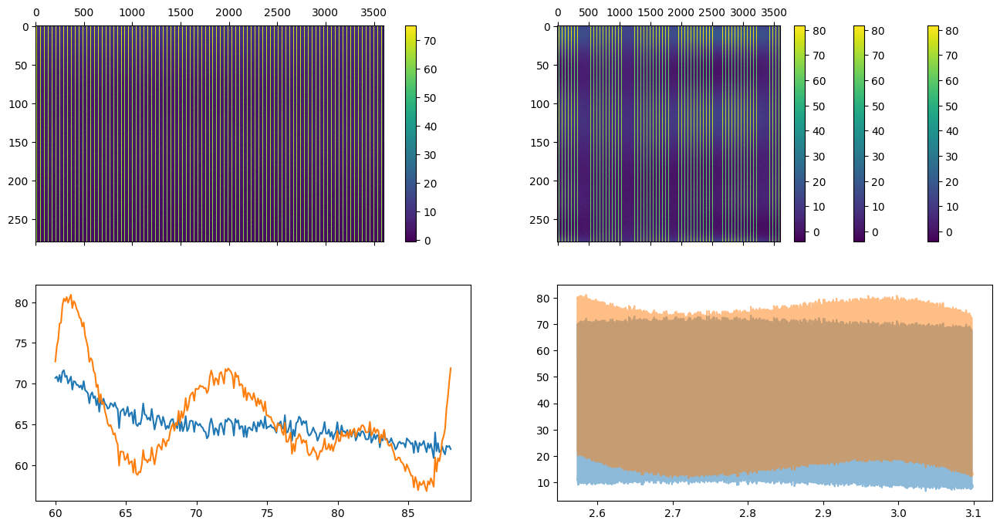

In [70]:
# Plot input data before and after application of noise wave effects
plt.subplot(221)
plt.matshow(input_signal.T, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(222)
plt.matshow(P_rec.T, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(223)
plt.plot(freqs, input_signal.T[:,10])
plt.plot(freqs, P_rec.T[:,10])
plt.colorbar()

plt.subplot(224)
plt.plot(lsts, input_signal.T[10,:], alpha=0.5)
plt.plot(lsts, P_rec.T[10,:], alpha=0.5)
plt.colorbar()

plt.gcf().set_size_inches((16., 8.))

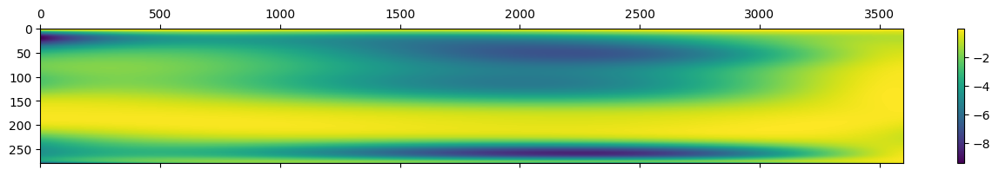

In [71]:
# Complex kappa factor
kappa = np.sqrt(1. - np.abs(Gamma_rec)**2.) / (1. - Gamma_src * Gamma_rec)

# Calculate sum of noise wave effects
plt.matshow((((1. - np.abs(Gamma_src)**2.) * np.abs(kappa)**2.).T - 1.)*393., aspect='auto')
plt.colorbar()

In [72]:
# Apply relevant noise-wave prefactor to data and noise diode on their own 
# (so they can be added together if needed)
kappa = np.sqrt(1. - np.abs(Gamma_rec)**2.) / (1. - Gamma_src * Gamma_rec)

# Sky signal + noise + other reflections
P_rec_nodiode = apply_noise_wave_params(Tsrc=sky_signal + noise, 
                                        Gamma_src=Gamma_src, 
                                        Gamma_rec=Gamma_rec, 
                                        Tunc=T_unc, 
                                        Tcos=T_cos, 
                                        Tsin=T_sin, 
                                        Toffset=T_offset)

# Only the noise diode part
P_ndiode = ndiode_alwayson * (1. - np.abs(Gamma_src)**2.) * np.abs(kappa)**2.

In [73]:
# Apply noise wave effects to calibration loads
# NOTE: We use the approximation that the loads have minimal reflections, 
# so that Gamma_src = 0. We also assume that Gamma_rec is the same as 
# when the antenna is the source.
# FIXME: T_offset can be different
P_load1 = apply_noise_wave_params(Tsrc=load1, 
                                  Gamma_src=0., 
                                  Gamma_rec=Gamma_rec, 
                                  Tunc=0., 
                                  Tcos=0., 
                                  Tsin=0., 
                                  Toffset=T_offset)

P_load2 = apply_noise_wave_params(Tsrc=load2, 
                                  Gamma_src=0., 
                                  Gamma_rec=Gamma_rec, 
                                  Tunc=0., 
                                  Tcos=0., 
                                  Tsin=0., 
                                  Toffset=T_offset)

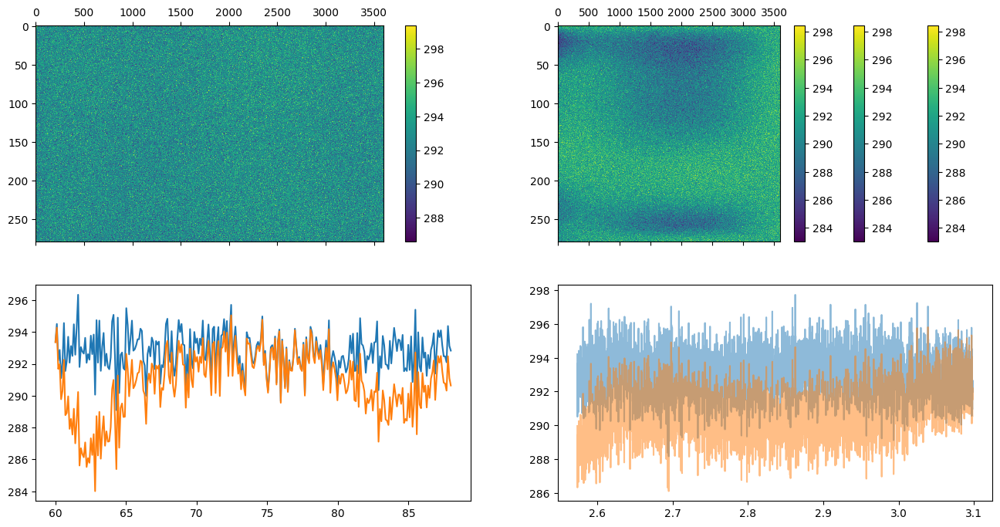

In [74]:
# Plot calibrator load 1 before and after application of noise wave effects
plt.subplot(221)
plt.matshow(load1.T, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(222)
plt.matshow(P_load1.T, aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(223)
plt.plot(freqs, load1.T[:,10])
plt.plot(freqs, P_load1.T[:,10])
plt.colorbar()

plt.subplot(224)
plt.plot(lsts, load1.T[10,:], alpha=0.5)
plt.plot(lsts, P_load1.T[10,:], alpha=0.5)
plt.colorbar()

plt.gcf().set_size_inches((16., 8.))

<a id='apply-gains'></a>
## Applying gains

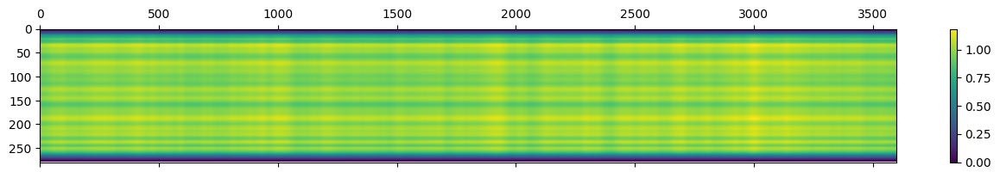

In [75]:
# Combined gain factor
gain = bandpass[np.newaxis,:] * gain_corr[:,np.newaxis]

# Plot overall gain
plt.matshow(gain.real.T, aspect='auto')
plt.colorbar()

In [76]:
# Modulate by receiver gain
data = P_rec * gain
data_load1 = P_load1 * gain
data_load2 = P_load2 * gain

data_nodiode = P_rec_nodiode * gain
data_diode = P_ndiode * gain

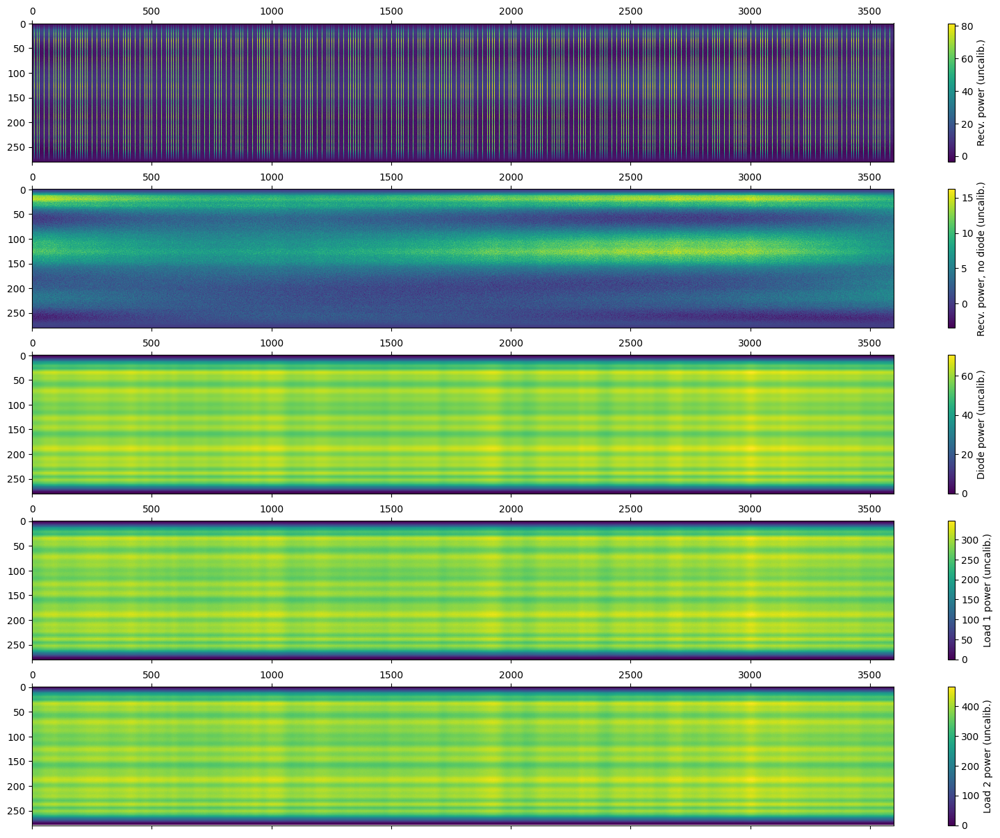

In [77]:
# Plot data after modulation by gains
plt.subplot(511)
plt.matshow(data.T, aspect='auto', fignum=False)
plt.colorbar(label="Recv. power (uncalib.)")

plt.subplot(512)
plt.matshow(data_nodiode.T, aspect='auto', fignum=False)
plt.colorbar(label="Recv. power, no diode (uncalib.)")

plt.subplot(513)
plt.matshow(data_diode.T, aspect='auto', fignum=False)
plt.colorbar(label="Diode power (uncalib.)")

plt.subplot(514)
plt.matshow(data_load1.T, aspect='auto', fignum=False)
plt.colorbar(label="Load 1 power (uncalib.)")

plt.subplot(515)
plt.matshow(data_load2.T, aspect='auto', fignum=False)
plt.colorbar(label="Load 2 power (uncalib.)")

plt.gcf().set_size_inches((20., 15.))

<a id='save-data'></a>
## Save data

In [78]:
# Save data
with h5py.File("%s.uvh5" % prefix, 'w') as f:
    
    # Store data array
    dset_d = f.create_dataset("data", data=data)
    dset_d.attrs['units'] = 'K'
    dset_d.attrs['obstime'] = str(obstime.iso)
    dset_d.attrs['location'] = str(location)
    dset_d.attrs['site_lat_deg'] = site_lat
    dset_d.attrs['site_lon_deg'] = site_lon
    dset_d.attrs['site_height_m'] = site_height
    
    # Store sky power (with reflection) and noise diode (with 
    # reflection prefactor) separately
    dset_d_nodiode = f.create_dataset("data_nodiode", data=data_nodiode)
    dset_diode = f.create_dataset("data_onlydiode", data=data_diode)
    
    # Store separate calibration load arrays
    dset_dload1 = f.create_dataset("data_load1", data=data_load1)
    dset_dload2 = f.create_dataset("data_load2", data=data_load2)
    
    # Store noise diode mask
    dset_nd = f.create_dataset("ndiode_mask", data=ndiode_mask)
    dset_nd.attrs['Tdiode_Kelvin'] = Tdiode
    
    # Store reflection coefficients
    dset_Gamma_rec = f.create_dataset("data_Gamma_rec", data=Gamma_rec)
    dset_Gamma_src = f.create_dataset("data_Gamma_src", data=Gamma_src)
    
    # Frequency, time, LST arrays
    dset_f = f.create_dataset("freqs", data=freqs)
    dset_f.attrs['units'] = 'MHz'
    
    dset_t = f.create_dataset("times", data=times)
    dset_t.attrs['units'] = 's'
    
    dset_l = f.create_dataset("lsts", data=lsts)
    dset_l.attrs['units'] = 'rad'
    
print("Saved to %s.uvh5" % prefix)

Saved to sim_global_vivaldi_sparse_refl.uvh5


In [79]:
# Save individual components of simulation
with h5py.File("%s.sim.hdf5" % prefix, 'w') as f:
    
    # Frequency, time, LST arrays
    dset_f = f.create_dataset("freqs", data=freqs)
    dset_f.attrs['units'] = 'MHz'
    dset_t = f.create_dataset("times", data=times)
    dset_t.attrs['units'] = 's'
    dset_l = f.create_dataset("lsts", data=lsts)
    dset_l.attrs['units'] = 'rad'
    
    # Store data array
    dset_d = f.create_dataset("data", data=data)
    dset_d.attrs['units'] = 'K'
    dset_d.attrs['obstime'] = str(obstime.iso)
    dset_d.attrs['location'] = str(location)
    dset_d.attrs['site_lat_deg'] = site_lat
    dset_d.attrs['site_lon_deg'] = site_lon
    dset_d.attrs['site_height_m'] = site_height
    dset_d.attrs['random_seed'] = random_seed
    
    # Store calibration load arrays
    dset_dload1 = f.create_dataset("load1", data=data_load1)
    dset_dload2 = f.create_dataset("load2", data=data_load2)
    
    # Temperature: Diffuse
    dset_diffuse = f.create_dataset("Tdiffuse", data=d_diffuse)
    dset_diffuse.attrs['units'] = 'K'
    
    # Temperature: Point sources
    dset_ptsrc = f.create_dataset("Tptsrc", data=ptsrc_vis)
    dset_ptsrc.attrs['units'] = 'K'
    
    # Temperature: 21cm brightness temperature
    dset_tb = f.create_dataset("Tb21", data=Tb)
    dset_tb.attrs['units'] = 'K'
    
    # Input sky + diode data
    dset_input = f.create_dataset("input_signal", data=input_signal)
    
    # Point source catalogue
    dset_ps_ra = f.create_dataset("ptsrc_ra", data=ptsrc_ra)
    dset_ps_ra.attrs['units'] = 'deg'
    dset_ps_dec = f.create_dataset("ptsrc_dec", data=ptsrc_dec)
    dset_ps_dec.attrs['units'] = 'deg'
    dset_ps_flux0 = f.create_dataset("ptsrc_flux0", data=ptsrc_flux0)
    dset_ps_flux0.attrs['units'] = 'Jy'
    dset_ps_flux0.attrs['ref_freq_MHz'] = 100.
    dset_ps_beta = f.create_dataset("ptsrc_beta", data=ptsrc_beta)
    
    # Beam
    dset_beam = f.create_dataset("beam", data=beam)
    dset_beam.attrs['type'] = beams[0].beam_type
    dset_beam_az = f.create_dataset("beam_az", data=az)
    dset_beam_az.attrs['units'] = 'deg'
    dset_beam_za = f.create_dataset("beam_za", data=za)
    dset_beam_za.attrs['units'] = 'deg'
    
    # Bandpass
    dset_bandpass = f.create_dataset("bandpass", data=bandpass)
    dset_bandpass.attrs['bandpass_ncoeffs'] = bandpass_ncoeffs
    dset_bandpass.attrs['bandpass_ripple_factor'] = bandpass_ripple_factor
    dset_bandpass.attrs['bandpass_rolloff_scale_low'] = bandpass_rolloff_scale_low
    dset_bandpass.attrs['bandpass_rolloff_scale_high'] = bandpass_rolloff_scale_high
    
    # Time-dep. gains
    dset_gain_corr = f.create_dataset("gain_corr", data=gain_corr)
    dset_gain_corr.attrs['gain_corr_beta'] = gain_corr_beta
    dset_gain_corr.attrs['gain_corr_scale'] = gain_corr_scale
    dset_gain_corr.attrs['gain_corr_fknee'] = fknee
    
    # Noise diode data
    dset_nd = f.create_dataset("ndiode_signal", data=ndiode_signal)
    dset_nd.attrs['Tdiode_Kelvin'] = Tdiode
    dset_nd.attrs['ndiode_ripple_factor'] = ndiode_ripple_factor
    dset_nd.attrs['ndiode_cadence'] = ndiode_cadence
    dset_nd.attrs['ndiode_duration'] = ndiode_duration
    dset_nd.attrs['ndiode_gain'] = ndiode_gain
    #dset_ndbp = f.create_dataset("ndiode_bandpass_coeffs", data=ndiode_bandpass_coeffs)
    dset_nds = f.create_dataset("ndiode_shape", data=ndiode_shape)
    dset_nds.attrs['ndiode_bandpass_ripple_factor'] = ndiode_bandpass_ripple_factor
    #dset_ndc = f.create_dataset("ndiode_coeffs", data=ndiode_coeffs)
    
    # Calibration loads
    dset_load1 = f.create_dataset("load1_signal", data=load1_signal)
    dset_load1.attrs['Tload1_Kelvin'] = Tload1
    dset_load1.attrs['load1_time_ncoeffs'] = load1_time_ncoeffs
    dset_load1.attrs['load1_freq_ncoeffs'] = load1_freq_ncoeffs
    dset_load1.attrs['load1_time_amp'] = load1_time_amp
    dset_load1.attrs['load1_freq_amp'] = load1_freq_amp
    
    dset_load2 = f.create_dataset("load2_signal", data=load2_signal)
    dset_load2.attrs['Tload2_Kelvin'] = Tload2
    dset_load2.attrs['load2_time_ncoeffs'] = load2_time_ncoeffs
    dset_load2.attrs['load2_freq_ncoeffs'] = load2_freq_ncoeffs
    dset_load2.attrs['load2_time_amp'] = load2_time_amp
    dset_load2.attrs['load2_freq_amp'] = load2_freq_amp
    
    # Calibration loads after reflections and noise added
    dset_Pload1 = f.create_dataset("Pload1", data=P_load1)
    dset_Pload2 = f.create_dataset("Pload2", data=P_load2)
    
    # Reflection coefficients
    dset_refl_Gamma_src = f.create_dataset("Gamma_src", data=Gamma_src)
    dset_refl_Gamma_src.attrs['Gamma_src_re0'] = Gamma_src_re0
    dset_refl_Gamma_src.attrs['Gamma_src_im0'] = Gamma_src_im0
    dset_refl_Gamma_src.attrs['Gamma_src_time_ncoeffs'] = Gamma_src_time_ncoeffs
    dset_refl_Gamma_src.attrs['Gamma_src_freq_ncoeffs'] = Gamma_src_freq_ncoeffs
    dset_refl_Gamma_src.attrs['Gamma_src_time_amp'] = Gamma_src_time_amp
    dset_refl_Gamma_src.attrs['Gamma_src_freq_amp'] = Gamma_src_freq_amp
    
    dset_refl_Gamma_rec = f.create_dataset("Gamma_rec", data=Gamma_rec)
    dset_refl_Gamma_rec.attrs['Gamma_rec_re0'] = Gamma_rec_re0
    dset_refl_Gamma_rec.attrs['Gamma_rec_im0'] = Gamma_rec_im0
    dset_refl_Gamma_rec.attrs['Gamma_rec_time_ncoeffs'] = Gamma_rec_time_ncoeffs
    dset_refl_Gamma_rec.attrs['Gamma_rec_freq_ncoeffs'] = Gamma_rec_freq_ncoeffs
    dset_refl_Gamma_rec.attrs['Gamma_rec_time_amp'] = Gamma_rec_time_amp
    dset_refl_Gamma_rec.attrs['Gamma_rec_freq_amp'] = Gamma_rec_freq_amp
    
    # Noise-wave temperature coefficients
    dset_refl_Tunc = f.create_dataset("noisewave_Tunc", data=T_unc)
    dset_refl_Tunc.attrs['Tunc0_Kelvin'] = Tunc0
    dset_refl_Tunc.attrs['Tunc_time_ncoeffs'] = Tunc_time_ncoeffs
    dset_refl_Tunc.attrs['Tunc_freq_ncoeffs'] = Tunc_freq_ncoeffs
    dset_refl_Tunc.attrs['Tunc_time_amp'] = Tunc_time_amp
    dset_refl_Tunc.attrs['Tunc_freq_amp'] = Tunc_freq_amp
    
    dset_refl_Tcos = f.create_dataset("noisewave_Tcos", data=T_unc)
    dset_refl_Tcos.attrs['Tcos0_Kelvin'] = Tcos0
    dset_refl_Tcos.attrs['Tcos_time_ncoeffs'] = Tcos_time_ncoeffs
    dset_refl_Tcos.attrs['Tcos_freq_ncoeffs'] = Tcos_freq_ncoeffs
    dset_refl_Tcos.attrs['Tcos_time_amp'] = Tcos_time_amp
    dset_refl_Tcos.attrs['Tcos_freq_amp'] = Tcos_freq_amp
    
    dset_refl_Tsin = f.create_dataset("noisewave_Tsin", data=T_sin)
    dset_refl_Tsin.attrs['Tsin0_Kelvin'] = Tsin0
    dset_refl_Tsin.attrs['Tsin_time_ncoeffs'] = Tsin_time_ncoeffs
    dset_refl_Tsin.attrs['Tsin_freq_ncoeffs'] = Tsin_freq_ncoeffs
    dset_refl_Tsin.attrs['Tsin_time_amp'] = Tsin_time_amp
    dset_refl_Tsin.attrs['Tsin_freq_amp'] = Tsin_freq_amp
    
    dset_refl_Toffset = f.create_dataset("noisewave_Toffset", data=T_offset)
    dset_refl_Toffset.attrs['Toffset0_Kelvin'] = Toffset0
    dset_refl_Toffset.attrs['Toffset_time_ncoeffs'] = Toffset_time_ncoeffs
    dset_refl_Toffset.attrs['Toffset_freq_ncoeffs'] = Toffset_freq_ncoeffs
    dset_refl_Toffset.attrs['Toffset_time_amp'] = Toffset_time_amp
    dset_refl_Toffset.attrs['Toffset_freq_amp'] = Toffset_freq_amp
    
print("Saved to %s.sim.hdf5" % prefix)

Saved to sim_global_vivaldi_sparse_refl.sim.hdf5


In [80]:
ls -lh *.hdf5

-rw-r--r-- 1 hgarsden ilifu-group  77M Feb 19 18:21 sim_global_airy_refl.hdf5
-rw-r--r-- 1 hgarsden ilifu-group 170M Feb 29 00:13 sim_global_airy_refl.sim.hdf5
-rw-r--r-- 1 hgarsden ilifu-group 170M Feb 22 23:50 sim_global_rhino1_refl.sim.hdf5
-rw-r--r-- 1 hgarsden ilifu-group 170M Feb 29 20:46 sim_global_rhino1_sparse_refl.sim.hdf5
-rw-r--r-- 1 hgarsden ilifu-group 170M Feb 27 14:58 sim_global_vivaldi_power_refl.sim.hdf5
-rw-r--r-- 1 hgarsden ilifu-group 170M Mar  5 17:03 sim_global_vivaldi_refl.sim.hdf5
-rw-r--r-- 1 hgarsden ilifu-group 170M Apr  5 22:12 sim_global_vivaldi_sparse_refl.sim.hdf5


### More complicated beam